<a href="https://colab.research.google.com/github/edwarddramirez/taxi-forecast/blob/main/MLP_for_taxi_dropoff_time_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install torch torchvision -U
! pip install pyarrow fastparquet

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 kB)
  Using cached nvidia_nvjitlink_cu12-12.6.20-py3-none-manyl

In [4]:
from google.colab import drive # Import the drive module

drive.mount('/content/mnt')

Mounted at /content/mnt


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cpu


In [7]:
ts = pd.read_pickle('/content/mnt/MyDrive/Taxi pick up/adjusted_yellow_2022-01_2024-03_bypulocation.pkl')
ts.head()

,PULocationID,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
0,4,2022-01-01 00:00:00-05:00,8,23.242388,1.886513,16.681875,3.363750,1.375000,14.481250
1,12,2022-01-01 00:00:00-05:00,1,36.592499,6.088500,25.830000,5.600000,4.000000,22.650000
2,13,2022-01-01 00:00:00-05:00,10,27.196531,3.027030,19.495501,4.386000,1.300000,14.801666
3,24,2022-01-01 00:00:00-05:00,10,18.574230,1.846230,12.915000,2.242000,1.200000,11.380000
4,41,2022-01-01 00:00:00-05:00,9,21.188799,1.549800,15.648334,3.082222,1.777778,13.890740


In [8]:
cutoff_time = pd.to_datetime('2023-10-19 14:00:00-04:00')
print(cutoff_time, type(cutoff_time))
train_data = ts.loc[ts['pickup_datetime'] < cutoff_time]
test_data = ts.loc[ts['pickup_datetime'] >= cutoff_time]
print(len(train_data), len(test_data))
train_data.tail(), test_data.head(), type(train_data), type(test_data)

2023-10-19 14:00:00-04:00 <class 'pandas._libs.tslibs.timestamps.Timestamp'>
987966 248535


(        PULocationID           pickup_datetime  counts  total_amount  \
 987961           246 2023-10-19 13:00:00-04:00      92     24.678804   
 987962           249 2023-10-19 13:00:00-04:00      70     20.981857   
 987963           261 2023-10-19 13:00:00-04:00      36     28.096945   
 987964           262 2023-10-19 13:00:00-04:00      84     20.525953   
 987965           263 2023-10-19 13:00:00-04:00      97     19.822062   
 
         tip_amount  fare_amount  trip_distance  passenger_count  trip_duration  
 987961    3.260326    17.418478       1.985978         1.282609      18.579710  
 987962    2.721857    14.260000       1.543143         1.257143      15.161429  
 987963    3.713611    20.383333       3.054444         1.222222      20.510185  
 987964    2.750952    13.775000       1.968452         1.130952      12.177382  
 987965    2.367423    13.511340       1.843608         1.298969      12.379382  ,
         PULocationID           pickup_datetime  counts  total_amou

<ipython-input-38-4ac0ff2d9a6a>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train_data_1 = train_data[ts['PULocationID'].isin([79])].copy()
<ipython-input-38-4ac0ff2d9a6a>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  test_data_1 = test_data[ts['PULocationID'].isin([79])].copy()


,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
987664,2023-10-19 09:00:00-04:00,69,20.015942,2.739130,13.276812,1.776812,1.101449,12.796618
987727,2023-10-19 10:00:00-04:00,48,19.969791,2.126042,13.895833,1.645000,1.145833,14.285417
987790,2023-10-19 11:00:00-04:00,48,20.844791,2.542708,14.302083,1.639167,1.125000,15.749306
987853,2023-10-19 12:00:00-04:00,50,21.552000,1.986000,15.516000,1.705400,1.260000,16.545666
987916,2023-10-19 13:00:00-04:00,36,22.821388,2.929722,15.891667,1.982500,1.416667,16.132408


,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
987979,2023-10-19 14:00:00-04:00,61,21.597050,2.513443,15.083606,1.718033,1.262295,16.132240
988042,2023-10-19 15:00:00-04:00,55,21.632908,2.885637,14.747272,1.627273,1.327273,15.469394
988105,2023-10-19 16:00:00-04:00,65,26.623077,3.400000,16.838461,1.820769,1.630769,18.414871
988168,2023-10-19 17:00:00-04:00,71,23.475351,2.444366,14.495774,1.576901,1.352113,15.493427
988231,2023-10-19 18:00:00-04:00,107,23.903738,3.166449,14.265327,1.580187,1.392523,14.059968


<Axes: xlabel='pickup_datetime'>

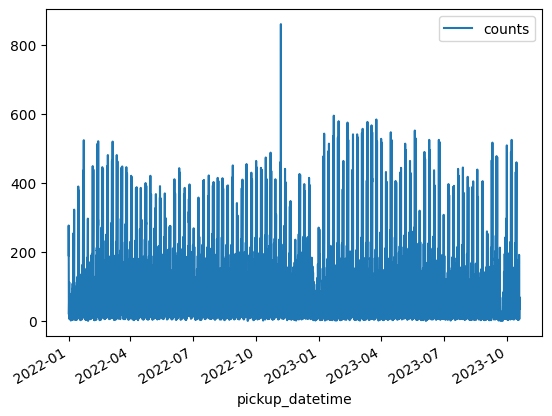

In [38]:
# taxi zone 79

train_data_1 = train_data[ts['PULocationID'].isin([79])].copy()
train_data_1.drop(columns = ['PULocationID'], inplace = True) # PULocationID is constant, drop it
test_data_1 = test_data[ts['PULocationID'].isin([79])].copy()
test_data_1.drop(columns = ['PULocationID'], inplace = True) # PULocationID is constant, drop it
display(train_data_1.tail())
display(test_data_1.head())
train_data_1.plot(x = 'pickup_datetime', y = 'counts')

In [39]:
train_data_1 = train_data_1['counts'].values
test_data_1 = test_data_1['counts'].values
train_data_1.shape, test_data_1.shape

# Normalize data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_data_1 = scaler.fit_transform(train_data_1.reshape(-1, 1))
test_data_1 = scaler.transform(test_data_1.reshape(-1, 1))

# Convert data to PyTorch tensors
train_data_1 = torch.tensor(train_data_1, dtype=torch.float32)
test_data_1 = torch.tensor(test_data_1, dtype=torch.float32)

print(train_data_1.shape)
print(test_data_1.shape)

torch.Size([15682, 1])
torch.Size([3945, 1])


In [40]:
sl = 24 # size of each slide (over time)
batch_size = 10

# Prepare the series into list of sequences (pair of input and target sequences)
data = [(train_data_1[i:i+sl], train_data_1[i+1:i+sl+1]) for i in range(0,len(train_data_1)-sl-1,sl)]
print(type(data))
print('N samples: ', len(data))
print('First sample: ', data[0])
print()

# Create Train and Validation sets - fix cutoff index to drop last few obs that are not enough to formm a batch
cut = int(len(data) * 0.8)
print('N samples in train set: ', len(data[:cut]))
print('N samples in validation set: ', len(data[cut:]))
print()

cut_train = cut - (cut % batch_size)
remain = len(data)-cut_train
cut_valid =  remain - (remain % batch_size)

# Create DataLoader for batch processing
train_loader = DataLoader(data[:cut_train], batch_size=batch_size, shuffle=False)
valid_loader = DataLoader(data[cut_train:cut_train + cut_valid], batch_size=batch_size, shuffle=False)

# Check size of Train and Validation sets in the dataloaders
print('N batches in train loader: ', len(list(train_loader)))
print('N batches in validation loader: ', len(list(valid_loader)))
print()


# shape of first batch: 2 stacks
print('shape of first batch (2 stacks) in train set: ')
print('shape of input stack: ', list(train_loader)[0][0].size()) # input
print('shape of target stack: ', list(train_loader)[0][1].size()) # target
print()

# first pair of input & target in the batch
print('first pair of input & target in the first batch in train set: ')
print(list(train_loader)[0][0][0]) # input
print(list(train_loader)[0][1][0]) # target

#Preparing input and target series for test data

test_data_slide = [(test_data_1[i:i+sl], test_data_1[i+1:i+sl+1]) for i in range(0,len(test_data_1)-sl-1,sl)]
print('N samples: ', len(test_data_slide))
print('First sample: ', test_data_slide[0])
print()

#Create test data loader

test_loader = DataLoader(test_data_slide, batch_size=batch_size, shuffle=False)
print('shape of first batch (2 stacks) in test set: ')
print('shape of input stack: ', list(test_loader)[0][0].size()) # input
print('shape of target stack: ', list(test_loader)[0][1].size()) # target
print()
print(list(test_loader)[0][0][0]) # input
print(list(test_loader)[0][1][0]) # target

<class 'list'>
N samples:  653
First sample:  (tensor([[0.2212],
        [0.3213],
        [0.3003],
        [0.2386],
        [0.1362],
        [0.0559],
        [0.0244],
        [0.0233],
        [0.0221],
        [0.0256],
        [0.0314],
        [0.0442],
        [0.0594],
        [0.0594],
        [0.0594],
        [0.0605],
        [0.0757],
        [0.0745],
        [0.0885],
        [0.1036],
        [0.0873],
        [0.1304],
        [0.1024],
        [0.0664]]), tensor([[0.3213],
        [0.3003],
        [0.2386],
        [0.1362],
        [0.0559],
        [0.0244],
        [0.0233],
        [0.0221],
        [0.0256],
        [0.0314],
        [0.0442],
        [0.0594],
        [0.0594],
        [0.0594],
        [0.0605],
        [0.0757],
        [0.0745],
        [0.0885],
        [0.1036],
        [0.0873],
        [0.1304],
        [0.1024],
        [0.0664],
        [0.0885]]))

N samples in train set:  522
N samples in validation set:  131

N batches in train l

## **MLP Model for zone 79 and hyperparameter tuning**

In [41]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, dropout_prob):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_prob) # Dropout layer


    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.dropout(out) # Apply dropout after activation
        out = self.fc2(out)
        return out

In [42]:
input_size = 1
hidden_size = 128
output_size = 1
dropout_prob = 0.5

model = MLP(input_size, hidden_size, output_size, dropout_prob)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)

In [43]:
# Training loop for single series MLP
num_epochs = 1000

## to keep track of if validation loss went up
times_valid_loss_went_up_in_a_row = 0

## an initial value
min_valid_loss = float("inf")

valid_loss_list = []

for epoch in range(num_epochs):
    ## Train
    model.train()
    epoch_train_loss = 0
    for batch_X, batch_y in train_loader:
        preds = model(batch_X)
        train_loss = criterion(preds, batch_y)

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

        epoch_train_loss += train_loss.item()

    avg_train_loss = epoch_train_loss / len(train_loader)
    scheduler.step()

  ## Validate
    model.eval()
    epoch_valid_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in valid_loader:
            preds = model(batch_X)
            valid_loss = criterion(preds, batch_y)

            epoch_valid_loss += valid_loss.item()

    avg_valid_loss = epoch_valid_loss / len(valid_loader)

    ## print out Train and Valiation loss for every 10 epochs
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss}, Validation Loss: {avg_valid_loss}')

    ## Early Stopping: check if the error went up or down
    valid_loss_list.append(avg_valid_loss)

# if it went down
    if valid_loss_list[-1] < min_valid_loss:
        # record the new minimum val error
        min_valid_loss = valid_loss_list[-1]

        # reset our up counter
        times_valid_loss_went_up_in_a_row = 0
    # if it went up
    else:
        # add to the counter
        times_valid_loss_went_up_in_a_row = times_valid_loss_went_up_in_a_row + 1
        # if this is the 300th time in a row it has gone up
        if times_valid_loss_went_up_in_a_row == 300:
            # stop early
            break

Epoch [10/1000], Train Loss: 0.002356878381061296, Validation Loss: 0.001554755332808082
Epoch [20/1000], Train Loss: 0.0022719296707341876, Validation Loss: 0.0017896396681093252
Epoch [30/1000], Train Loss: 0.0022361781727970364, Validation Loss: 0.0015121758602058084
Epoch [40/1000], Train Loss: 0.0021042671903090263, Validation Loss: 0.0014707109792372929
Epoch [50/1000], Train Loss: 0.0021089297034240398, Validation Loss: 0.0015498764517430502
Epoch [60/1000], Train Loss: 0.00208584666520787, Validation Loss: 0.0014698012337948268
Epoch [70/1000], Train Loss: 0.0020632469442296917, Validation Loss: 0.0014818987871806782
Epoch [80/1000], Train Loss: 0.0019950981054884884, Validation Loss: 0.0014786544846943938
Epoch [90/1000], Train Loss: 0.0019484348069034661, Validation Loss: 0.0015022299261405491
Epoch [100/1000], Train Loss: 0.0019409744608520458, Validation Loss: 0.0014565508329094602
Epoch [110/1000], Train Loss: 0.0019604231157035637, Validation Loss: 0.0014598157946378565
E

MSE: 1333.3643798828125


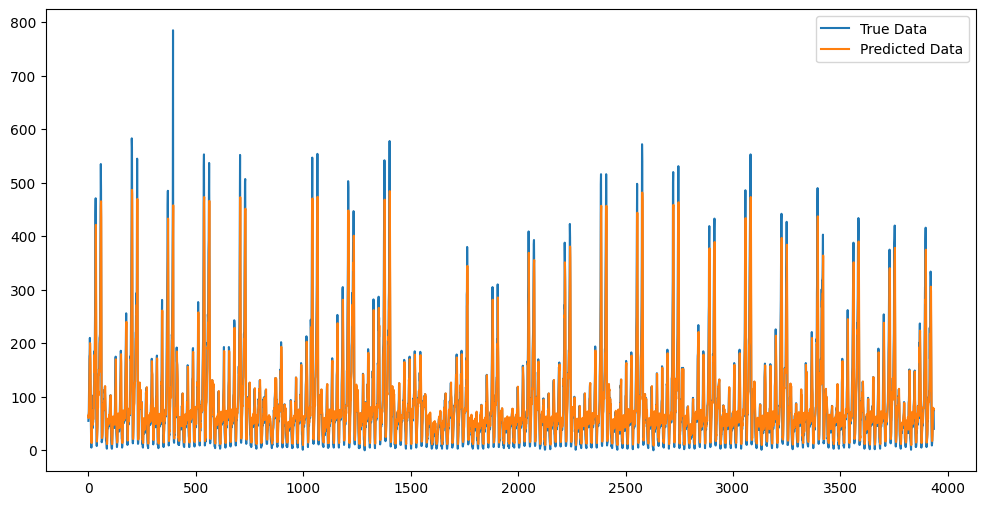

In [44]:
model.eval()
with torch.no_grad():
    test_preds = []
    test_labels = []

    for batch_X, batch_y in test_loader:
        preds = model(batch_X)
        test_preds.append(preds)
        test_labels.append(batch_y)

    test_preds = torch.cat(test_preds, dim=0)
    test_labels = torch.cat(test_labels, dim=0)


    # Inverse transform to get the original scale
    test_preds = scaler.inverse_transform(test_preds.numpy().reshape(-1, 1))
    test_labels = scaler.inverse_transform(test_labels.numpy().reshape(-1, 1))
    test_loss = mean_squared_error(test_preds, test_labels)
    print(f'MSE: {test_loss}')

    plt.figure(figsize=(12, 6))
    plt.plot(range(len(test_labels)), test_labels, label='True Data')
    plt.plot(range(len(test_preds)), test_preds, label='Predicted Data')
    plt.legend()
    plt.show()

In [21]:
from sklearn.base import BaseEstimator
class PyTorchModelWrapper(BaseEstimator):
    def __init__(self, hidden_size = 64,dropout_prob =0.2, lr = 0.01, gamma = 0.1, step_size =10, num_epochs=100, input_size=1, output_size=1):
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.dropout_prob = dropout_prob
        self.lr = lr
        self.gamma = gamma
        self.step_size = step_size
        self.num_epochs = num_epochs
        self.model = MLP(input_size, hidden_size, output_size, dropout_prob)
        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr)
        self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, step_size=step_size, gamma=gamma)

    def fit(self, X, y):
        # Convert data to PyTorch tensors
        X_tensor = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.float32)

        # Training loop
        for epoch in range(self.num_epochs):
            for batch_X, batch_y in train_loader: # Iterate over batches
                outputs = self.model(batch_X)
                loss = self.criterion(outputs, batch_y)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
            self.scheduler.step()
        return self

    def predict(self, X):
        # Convert data to PyTorch tensor
        X_tensor = torch.tensor(X, dtype=torch.float32)

        # Make predictions
        self.model.eval()
        with torch.no_grad():
            predictions = self.model(X_tensor)
        return predictions.detach().cpu().numpy().flatten()

    def score(self, X, y):
        # Calculate MSE loss
        predictions = self.predict(X)
        print(predictions.shape, type(predictions))
        print(y.shape, type(y))
        loss = np.mean((predictions - y) ** 2)
        return -loss  # Return negative MSE for maximization

In [22]:
param_grid = {
    'hidden_size': [32, 64, 128],
    'dropout_prob': [0.2, 0.5],
    'num_epochs': [400],
    'lr': [0.01, 0.001, 0.05],
    'step_size': [10, 30, 50],
    'gamma': [0.1, 0.5]
}


In [23]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=2)
def custom_scorer(estimator, X, y):
  fold_scores = []
  for train_index, test_index in tscv.split(X):
      X_train, X_test = X[train_index], X[test_index]
      y_train, y_test = y[train_index], y[test_index]

      estimator.epochs_per_fold = 50  # Adjust as needed
      estimator.fit(X_train, y_train)
      y_pred = estimator.predict(X_test)

      fold_scores.append(mean_squared_error(y_test, y_pred))
      print(y_pred.shape, y_test.shape)

  return -np.mean(fold_scores)  # Return negative MSE for maximization

In [24]:
from sklearn.model_selection import RandomizedSearchCV

# Create PyTorchModelWrapper instance
wrapper = PyTorchModelWrapper(input_size=1, output_size=1)
random_search = RandomizedSearchCV(wrapper, param_grid, cv=tscv, scoring=custom_scorer, n_jobs=-1)

# Extract data from train_loader
X_train = []
y_train = []
for batch_X, batch_y in train_loader:
    X_train.append(batch_X.numpy())
    y_train.append(batch_y.numpy())

# Concatenate batches into NumPy arrays
X_train = np.concatenate(X_train, axis=0)
y_train = np.concatenate(y_train, axis=0)

# Fit using NumPy arrays
random_search.fit(X_train, y_train)

# Get best hyperparameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_
print("Best Hyperparameters:", best_params)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


Best Hyperparameters: {'step_size': 10, 'num_epochs': 400, 'lr': 0.01, 'hidden_size': 128, 'gamma': 0.5, 'dropout_prob': 0.5}


### **MLP model for all Manhattan Zones**

In [45]:
zones = ts.PULocationID.unique()
print('Zones', zones)
print('Number of Manhattan zones', len(zones))

Zones [  4  12  13  24  41  42  43  45  48  50  68  74  75  79  87  88  90 100
 107 113 114 116 120 125 127 128 137 140 141 142 143 144 148 151 152 158
 161 162 163 164 166 170 186 209 211 224 229 230 231 232 233 234 236 237
 238 239 243 244 246 249 261 262 263]
Number of Manhattan zones 63


In [46]:
#training models for all zones

input_size = 1
hidden_size = 128
output_size = 1
dropout_prob = 0.5
models = {}
test_loaders={}
scalers={}

for zone in zones:
    train_zone = train_data[train_data['PULocationID'].isin([zone])].copy()
    train_zone.drop(columns = ['PULocationID'], inplace = True)

    test_zone = test_data[test_data['PULocationID'].isin([zone])].copy()
    test_zone.drop(columns = ['PULocationID'], inplace = True)

    train_zone_data = train_zone['counts'].values
    test_zone_data = test_zone['counts'].values

    # Normalize data
    scaler_zone = MinMaxScaler()
    train_zone_data = scaler_zone.fit_transform(train_zone_data.reshape(-1, 1))
    test_zone_data = scaler_zone.transform(test_zone_data.reshape(-1, 1))

    # Convert data to PyTorch tensors
    train_zone_data = torch.tensor(train_zone_data, dtype=torch.float32)
    test_zone_data = torch.tensor(test_zone_data, dtype=torch.float32)

    #Prepare sliding window time series

    sl = 24 # size of each slide (over time)
    batch_size = 10

    # Prepare the series into list of sequences (pair of input and target sequences)
    train_zone_data = [(train_zone_data[i:i+sl], train_zone_data[i+1:i+sl+1]) for i in range(0,len(train_zone_data)-sl-1,sl)]

    # Create Train and Validation sets - fix cutoff index to drop last few obs that are not enough to formm a batch
    cut = int(len(train_zone_data) * 0.8)

    cut_train = cut - (cut % batch_size)
    remain = len(train_zone_data)-cut_train
    cut_valid =  remain - (remain % batch_size)

    # Create DataLoader for batch processing
    train_loader = DataLoader(train_zone_data[:cut_train], batch_size=batch_size, shuffle=False)
    valid_loader = DataLoader(train_zone_data[cut_train:cut_train + cut_valid], batch_size=batch_size, shuffle=False)

    #Create test dataloader

    test_data_slide = [(test_zone_data[i:i+sl], test_zone_data[i+1:i+sl+1]) for i in range(0,len(test_zone_data)-sl-1,sl)]
    test_loader = DataLoader(test_data_slide, batch_size=batch_size, shuffle=False)

    #Instantiate new MLP model for each zone

    model = MLP(input_size, hidden_size, output_size, dropout_prob)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.01)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)

    # Training loop for MLP for this zone
    num_epochs = 1000

    ## to keep track of if validation loss went up
    times_valid_loss_went_up_in_a_row = 0

    ## an initial value
    min_valid_loss = float("inf")

    valid_loss_list = []

    for epoch in range(num_epochs):
        ## Train
        model.train()
        epoch_train_loss = 0
        for batch_X, batch_y in train_loader:
            preds = model(batch_X)
            train_loss = criterion(preds, batch_y)

            optimizer.zero_grad()
            train_loss.backward()
            optimizer.step()

            epoch_train_loss += train_loss.item()

        avg_train_loss = epoch_train_loss / len(train_loader)
        scheduler.step()

      ## Validate
        model.eval()
        epoch_valid_loss = 0
        with torch.no_grad():
            for batch_X, batch_y in valid_loader:
                preds = model(batch_X)
                valid_loss = criterion(preds, batch_y)

                epoch_valid_loss += valid_loss.item()

        avg_valid_loss = epoch_valid_loss / len(valid_loader)

        ## print out Train and Valiation loss for every 10 epochs
        if (epoch+1) % 10 == 0:
            print(f'Zone:{zone}, Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss}, Validation Loss: {avg_valid_loss}')

        ## Early Stopping: check if the error went up or down
        valid_loss_list.append(avg_valid_loss)

        # if it went down
        if valid_loss_list[-1] < min_valid_loss:
            # record the new minimum val error
            min_valid_loss = valid_loss_list[-1]

            # reset our up counter
            times_valid_loss_went_up_in_a_row = 0
        # if it went up
        else:
            # add to the counter
            times_valid_loss_went_up_in_a_row = times_valid_loss_went_up_in_a_row + 1
            # if this is the 50th time in a row it has gone up
            if times_valid_loss_went_up_in_a_row == 300:
                # stop early
                break

    # Save the model for this zone in dictionary
    models[zone] = model
    scalers[zone] = scaler_zone
    test_loaders[zone] = test_loader
    print(f'Zone:{zone} model saved, Final validation loss:{avg_valid_loss} ')

Zone:4, Epoch [10/1000], Train Loss: 0.0036686691254054983, Validation Loss: 0.004149502644745203
Zone:4, Epoch [20/1000], Train Loss: 0.0037438535744933267, Validation Loss: 0.0042294276287206094
Zone:4, Epoch [30/1000], Train Loss: 0.0036289402946399953, Validation Loss: 0.0039855102256227
Zone:4, Epoch [40/1000], Train Loss: 0.003552596091489809, Validation Loss: 0.00392350722820713
Zone:4, Epoch [50/1000], Train Loss: 0.0036421318968328144, Validation Loss: 0.003974018179668257
Zone:4, Epoch [60/1000], Train Loss: 0.0035214329187650806, Validation Loss: 0.00390463055541309
Zone:4, Epoch [70/1000], Train Loss: 0.003576588637840289, Validation Loss: 0.003938372703627325
Zone:4, Epoch [80/1000], Train Loss: 0.0034242493275087327, Validation Loss: 0.003930495980267341
Zone:4, Epoch [90/1000], Train Loss: 0.003524609125004365, Validation Loss: 0.003902221071677139
Zone:4, Epoch [100/1000], Train Loss: 0.003528283479122015, Validation Loss: 0.003909925437675646
Zone:4, Epoch [110/1000], 

In [47]:
def smape(y, y_pred):
    # From pytorch-forecasting
    return np.mean(2*np.abs(y - y_pred) / (np.abs(y) + np.abs(y_pred)))

Zone:4, MSE: 20.81093978881836, SMAPE: 0.9035679697990417


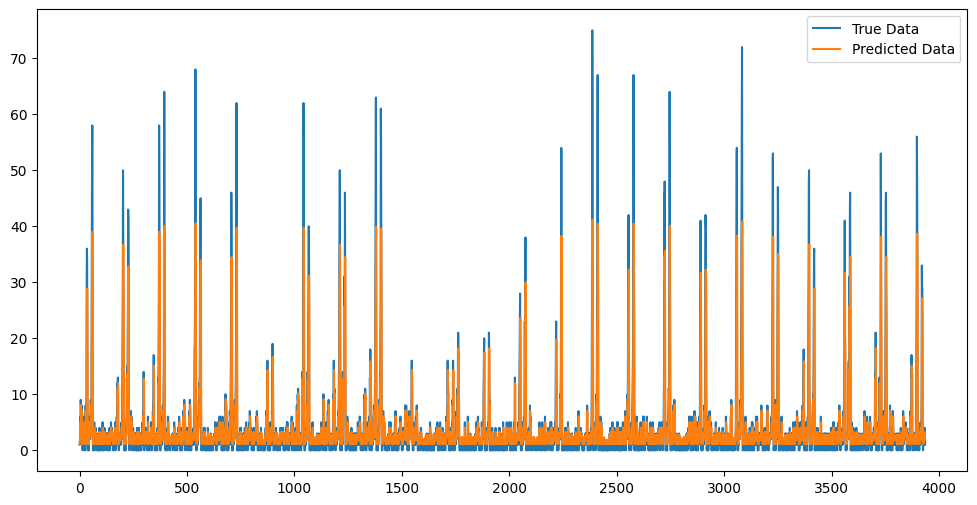

Zone:12, MSE: 2.802619695663452, SMAPE: 1.4642658233642578


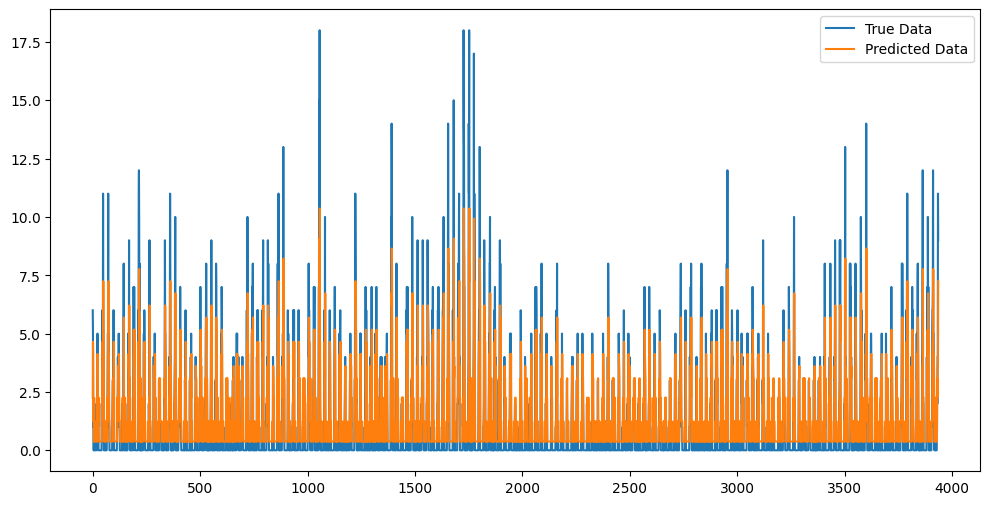

Zone:13, MSE: 74.9378662109375, SMAPE: 0.6754631400108337


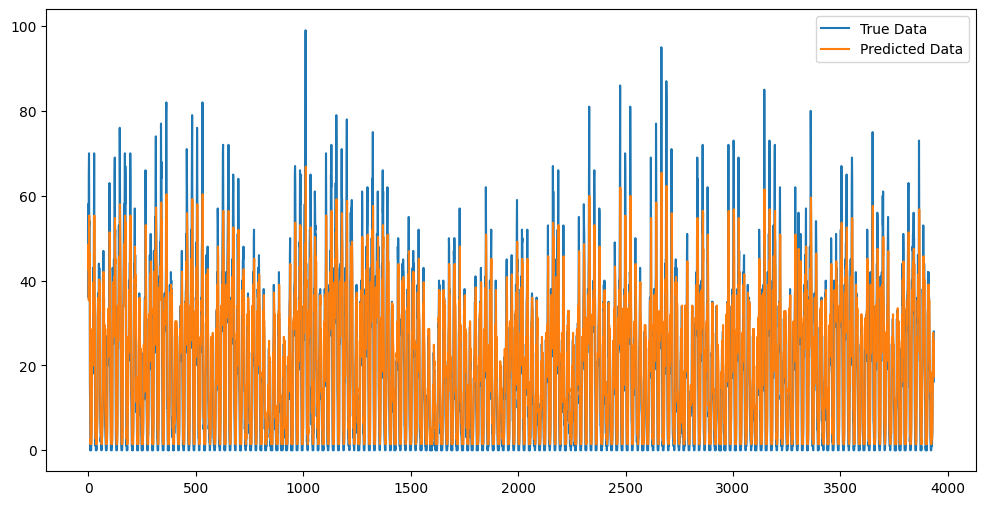

Zone:24, MSE: 24.646875381469727, SMAPE: 0.6228212118148804


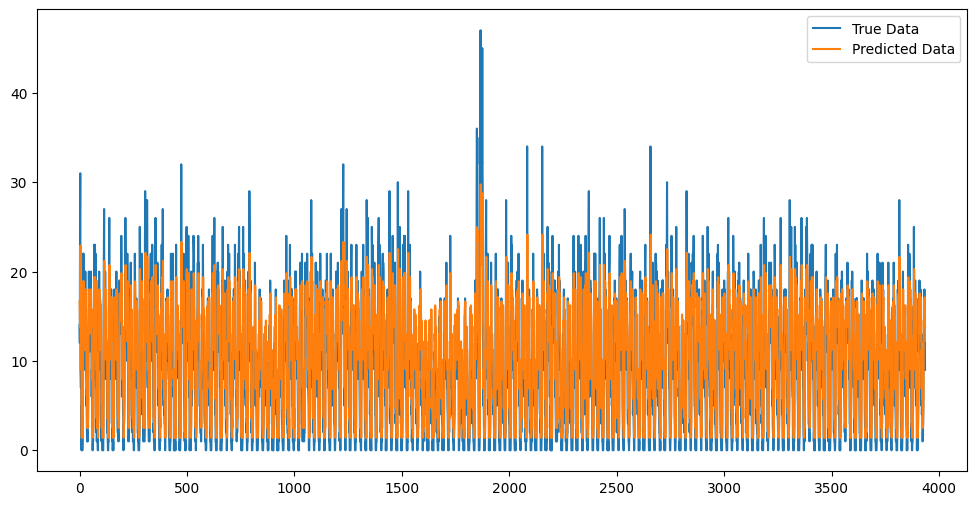

Zone:41, MSE: 19.98974609375, SMAPE: 0.6550763249397278


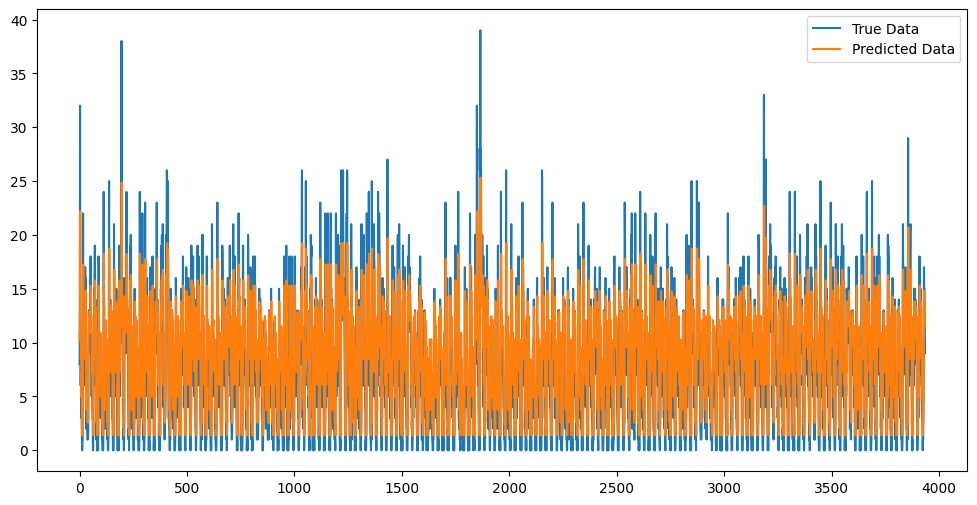

Zone:42, MSE: 4.281928062438965, SMAPE: 0.8433355093002319


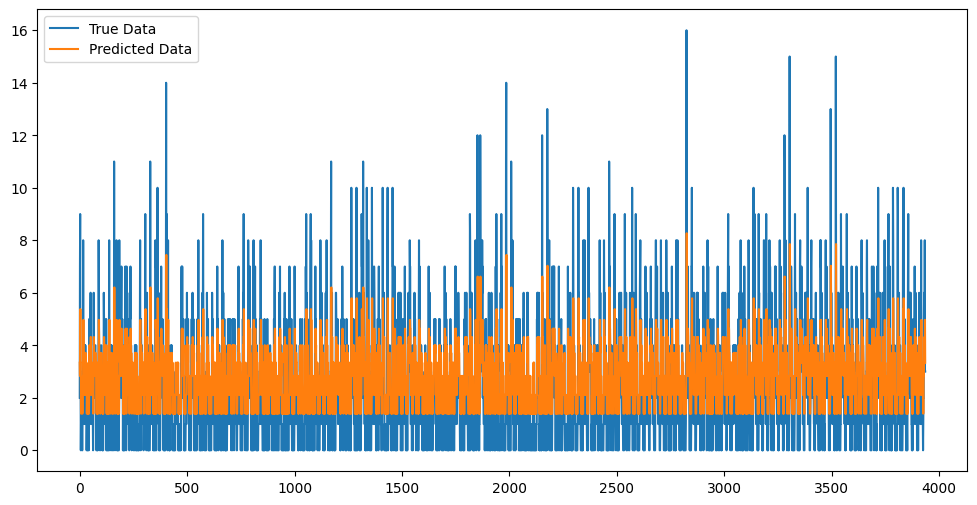

Zone:43, MSE: 650.429931640625, SMAPE: 0.6125960350036621


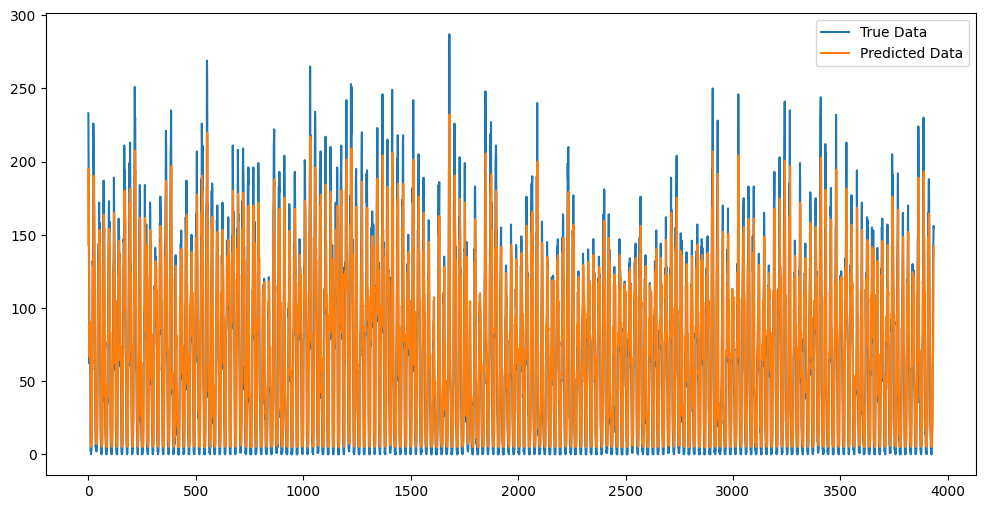

Zone:45, MSE: 7.912658214569092, SMAPE: 0.80338054895401


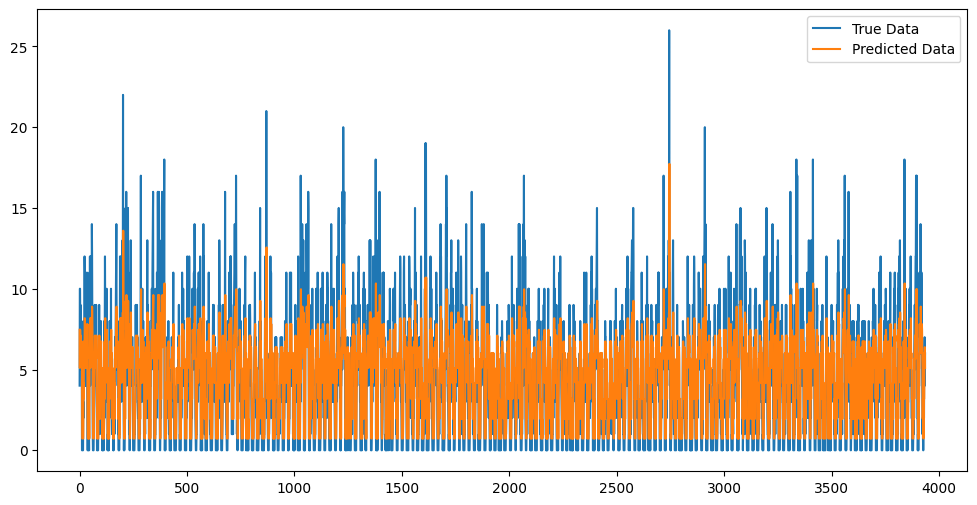

Zone:48, MSE: 857.7476196289062, SMAPE: 0.27738192677497864


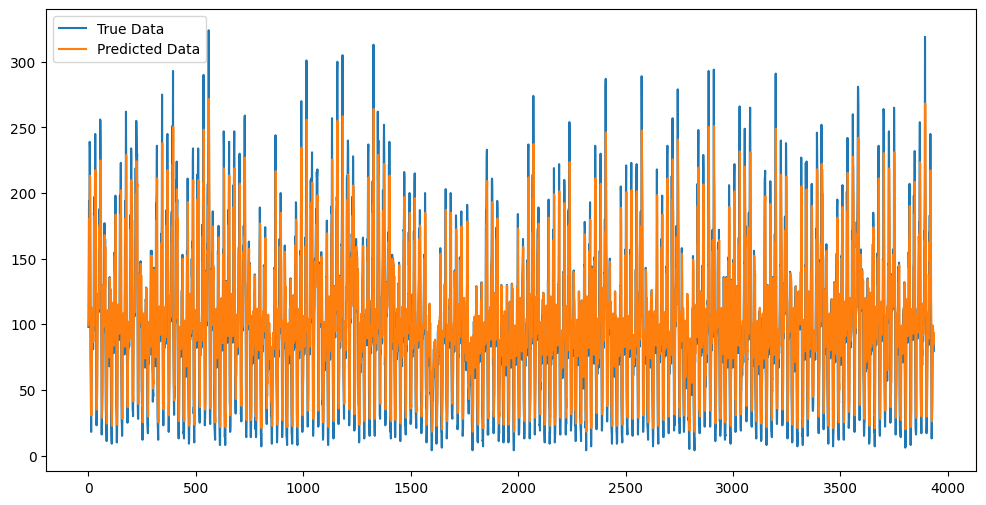

Zone:50, MSE: 86.21575164794922, SMAPE: 0.46263203024864197


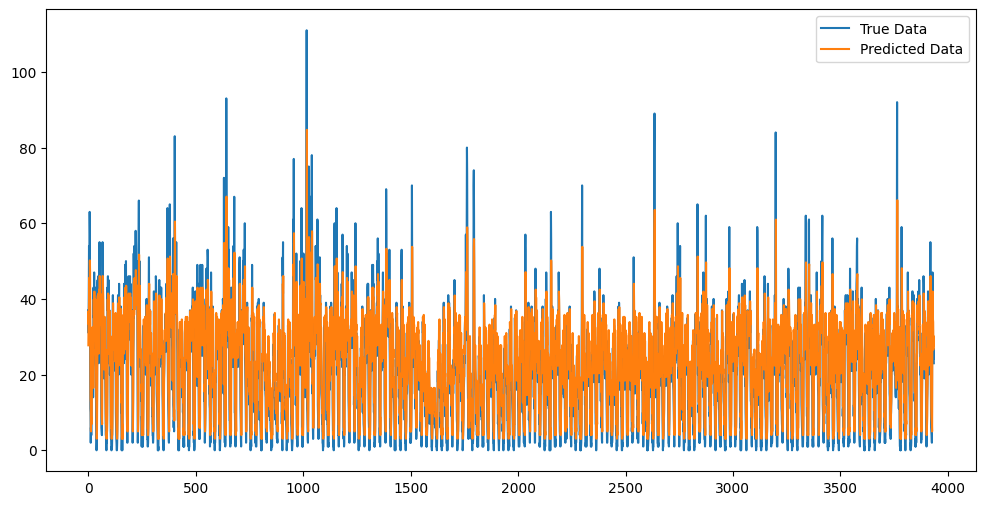

Zone:68, MSE: 763.4769287109375, SMAPE: 0.3395773470401764


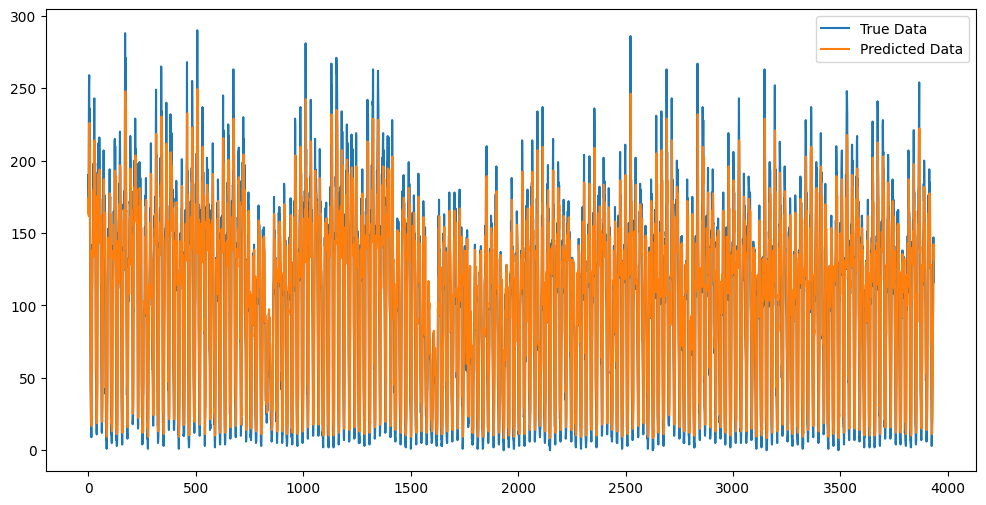

Zone:74, MSE: 14.989779472351074, SMAPE: 0.6113877296447754


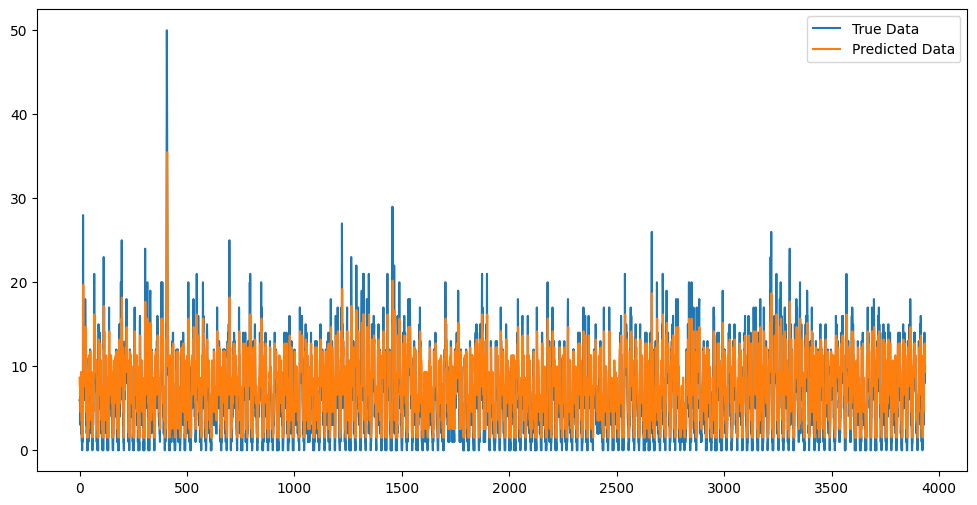

Zone:75, MSE: 68.07451629638672, SMAPE: 0.4898602366447449


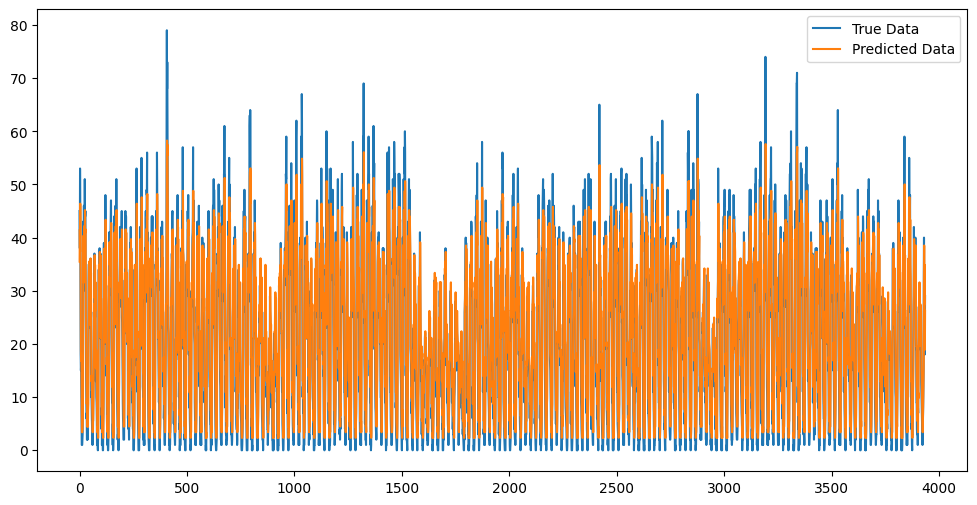

Zone:79, MSE: 1338.4072265625, SMAPE: 0.3358398377895355


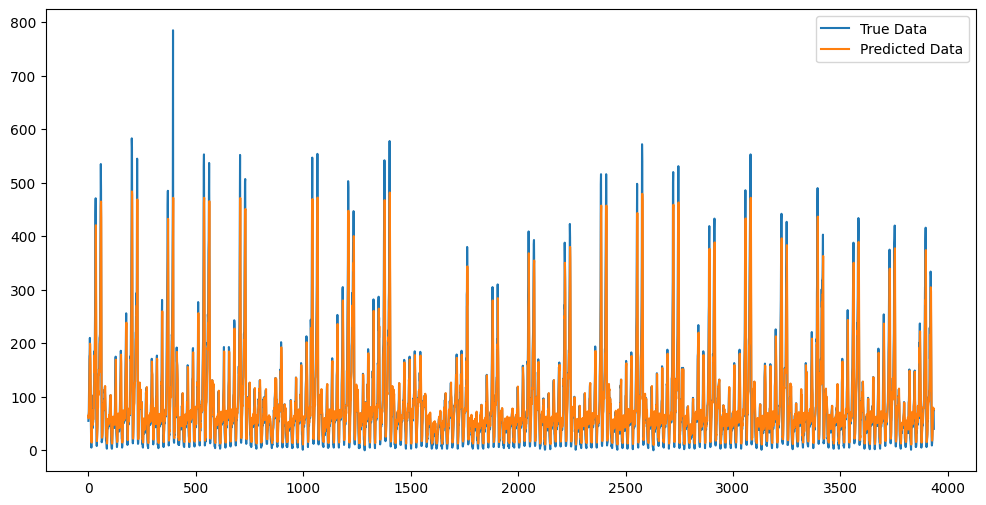

Zone:87, MSE: 48.334476470947266, SMAPE: 0.550632655620575


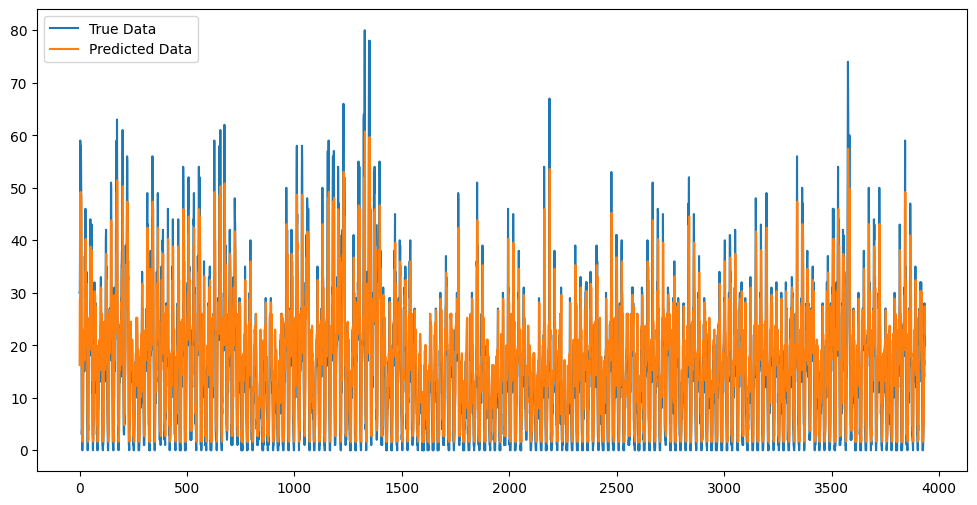

Zone:88, MSE: 21.68385887145996, SMAPE: 0.6740139722824097


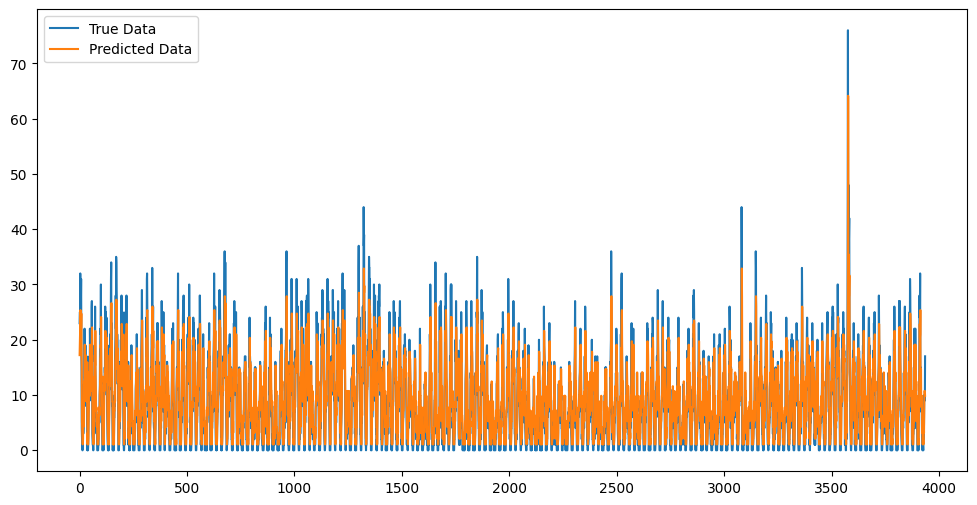

Zone:90, MSE: 321.9400939941406, SMAPE: 0.3639468550682068


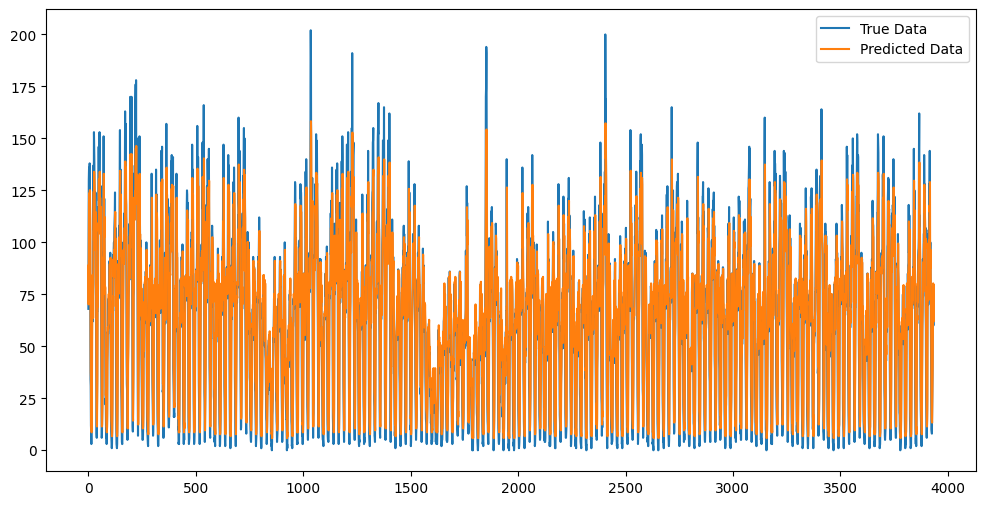

Zone:100, MSE: 345.2018737792969, SMAPE: 0.3501873314380646


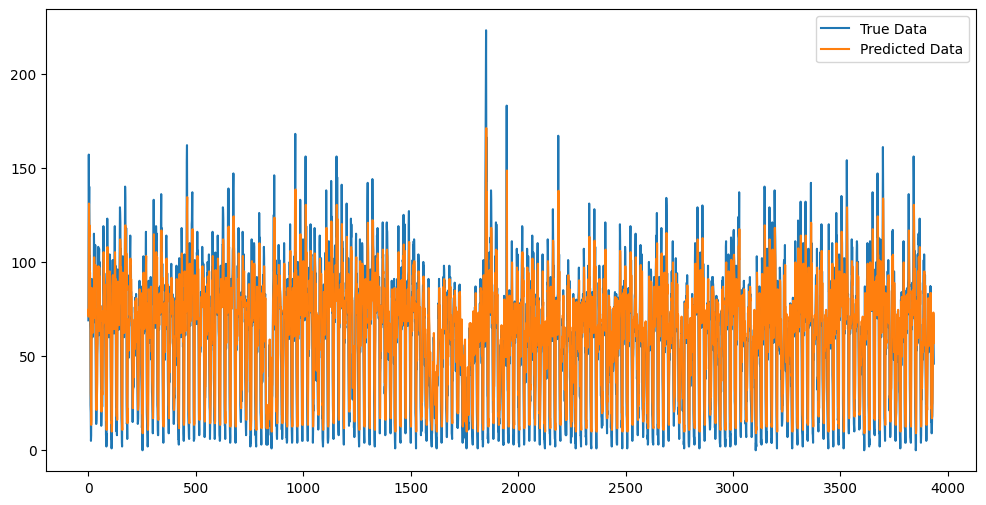

Zone:107, MSE: 538.5185546875, SMAPE: 0.3546883761882782


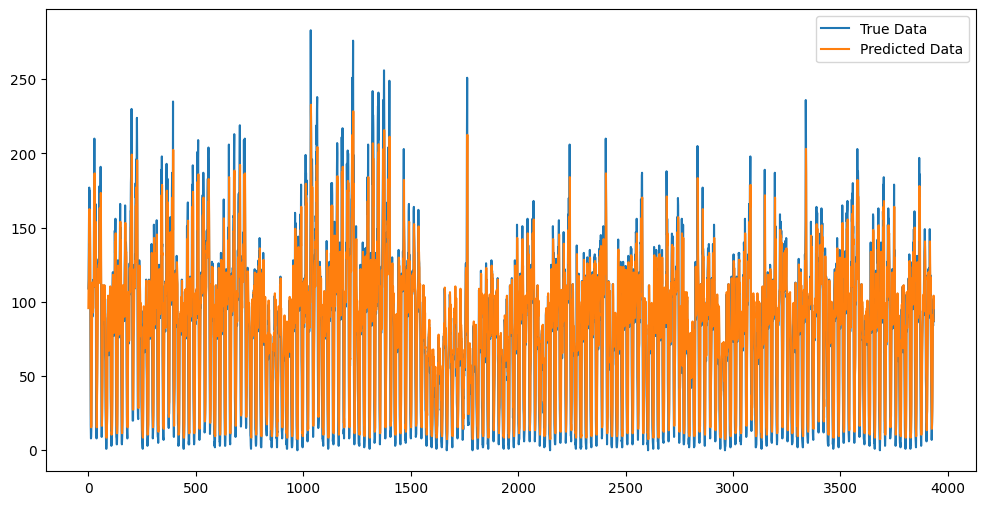

Zone:113, MSE: 287.6939697265625, SMAPE: 0.4498380124568939


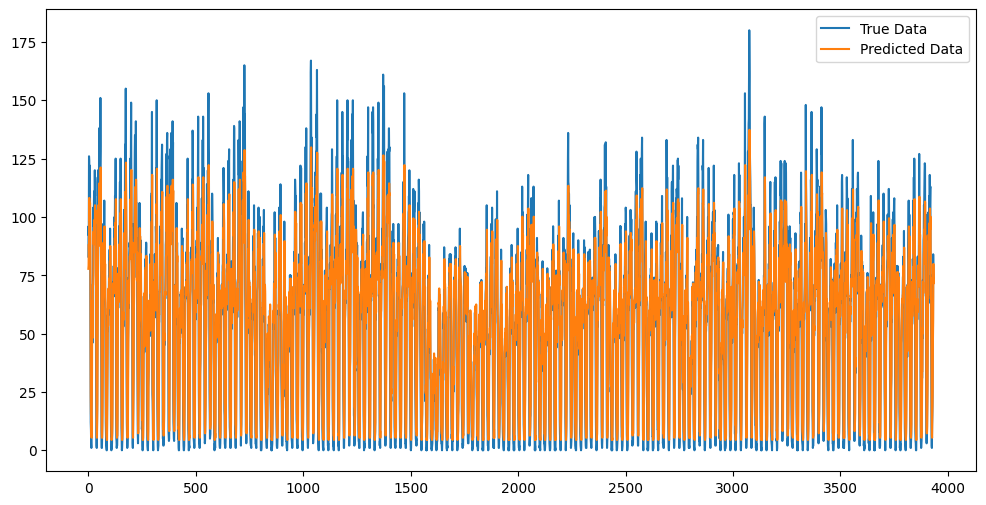

Zone:114, MSE: 697.70361328125, SMAPE: 0.42696255445480347


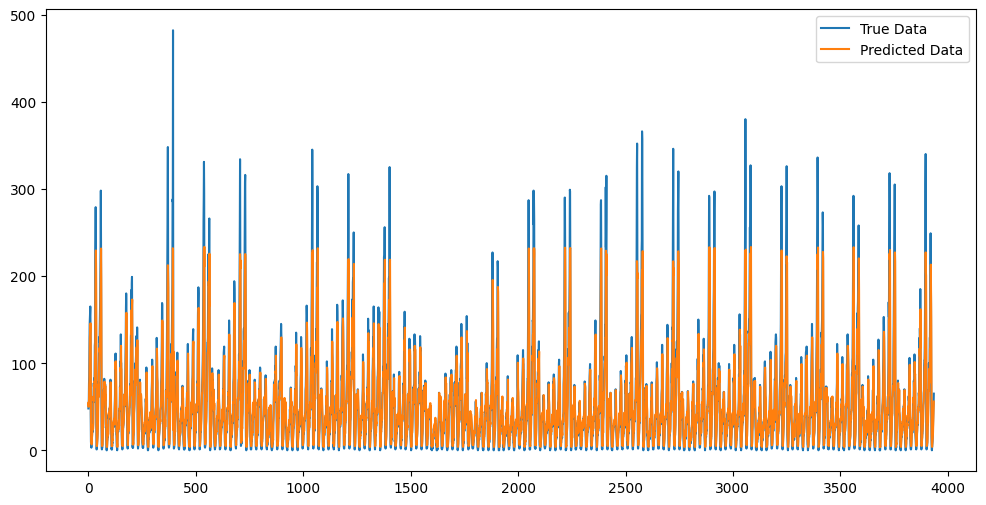

Zone:116, MSE: 4.00482702255249, SMAPE: 0.9285122156143188


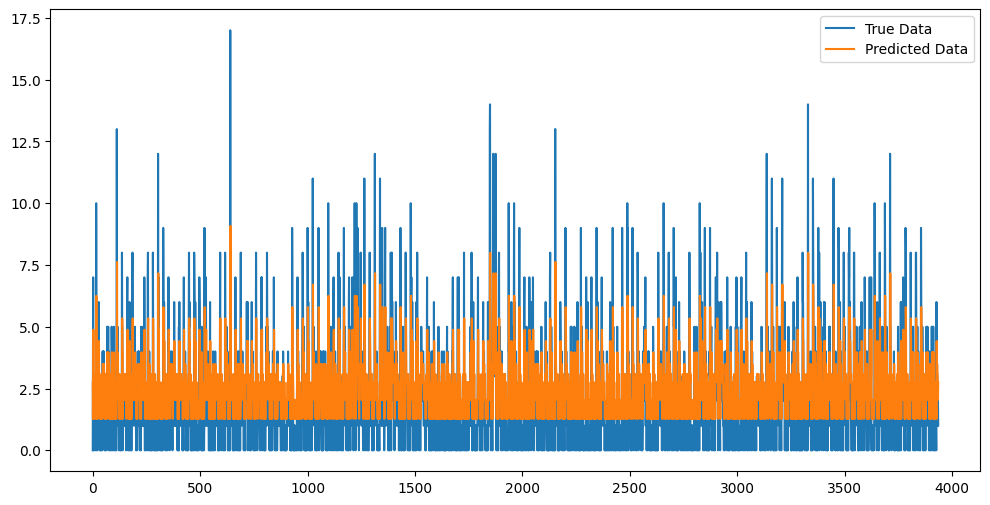

Zone:120, MSE: 0.00907052494585514, SMAPE: 1.9996379613876343


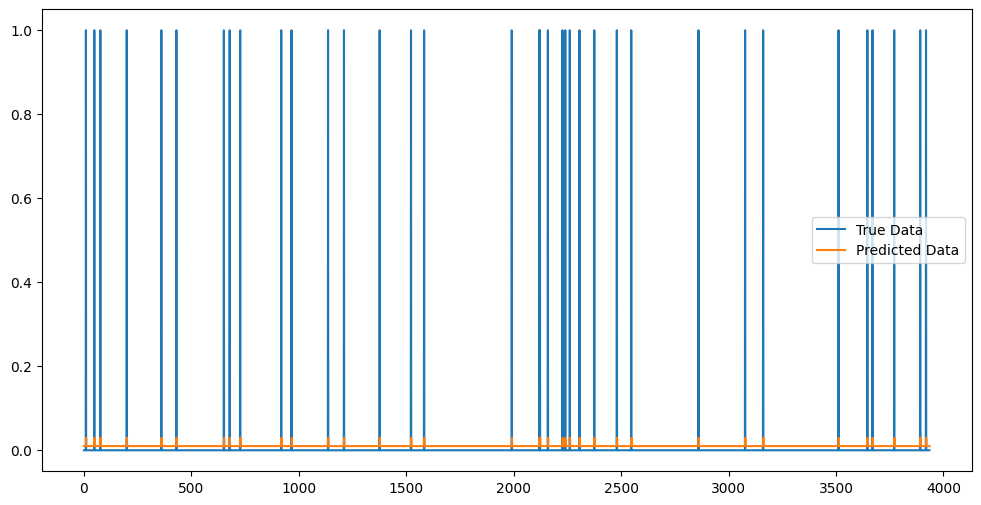

Zone:125, MSE: 53.28256607055664, SMAPE: 0.46458524465560913


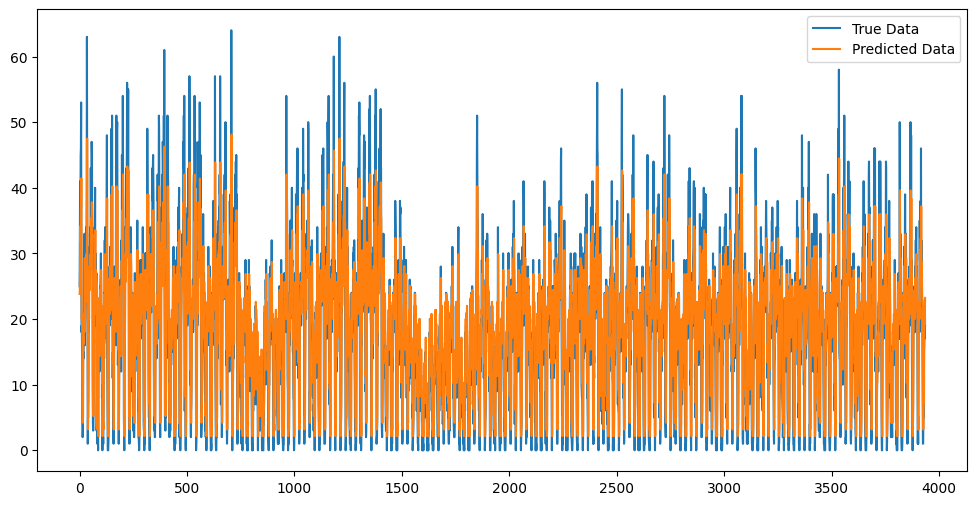

Zone:127, MSE: 0.14359216392040253, SMAPE: 1.9482707977294922


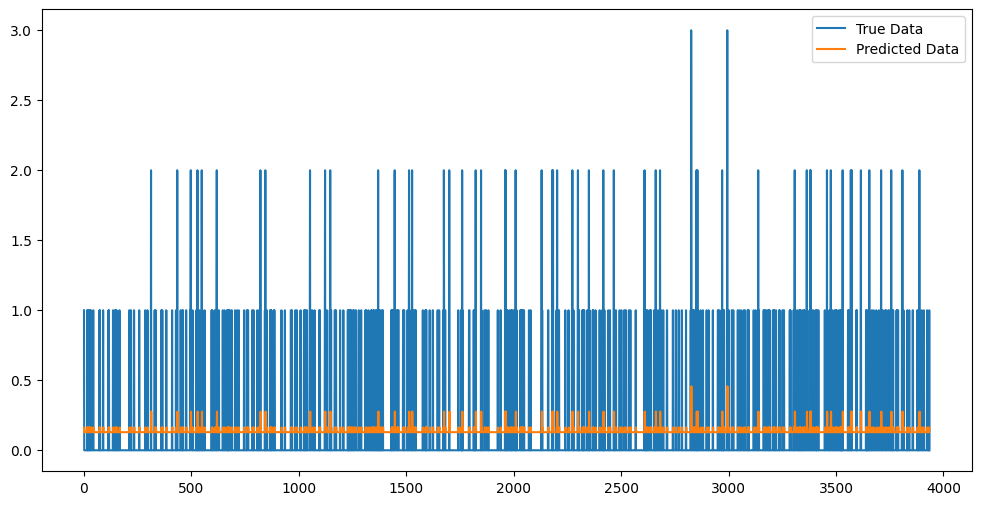

Zone:128, MSE: 0.012523841112852097, SMAPE: 1.9993469715118408


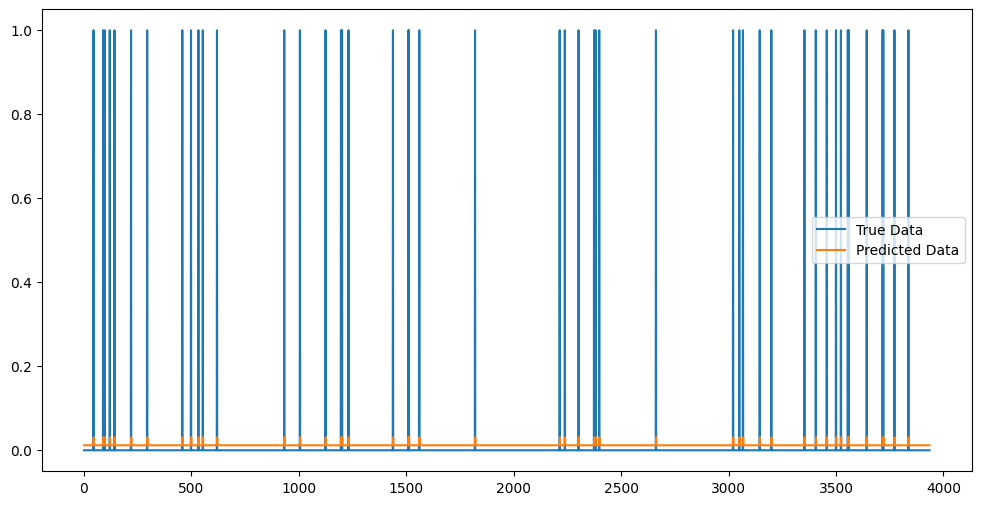

Zone:137, MSE: 146.97354125976562, SMAPE: 0.3706144690513611


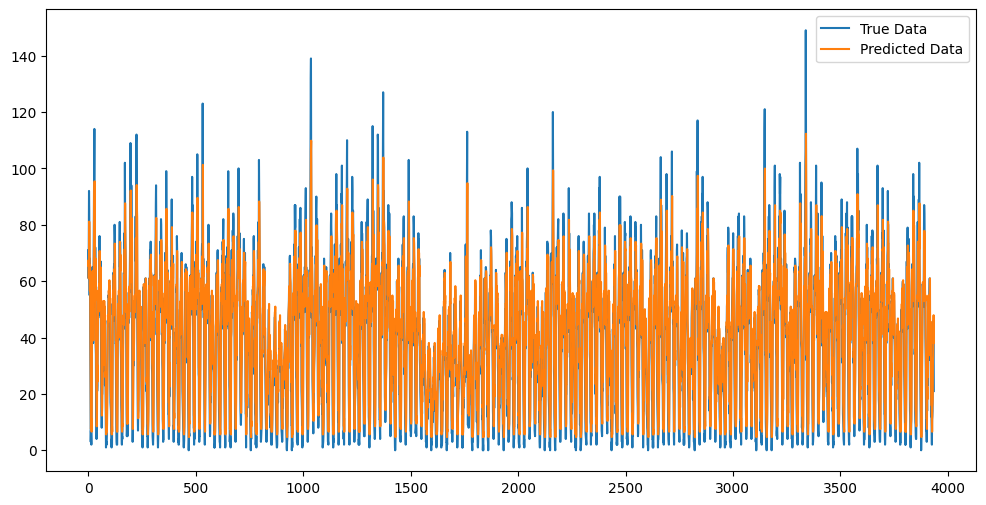

Zone:140, MSE: 553.6819458007812, SMAPE: 0.4307834804058075


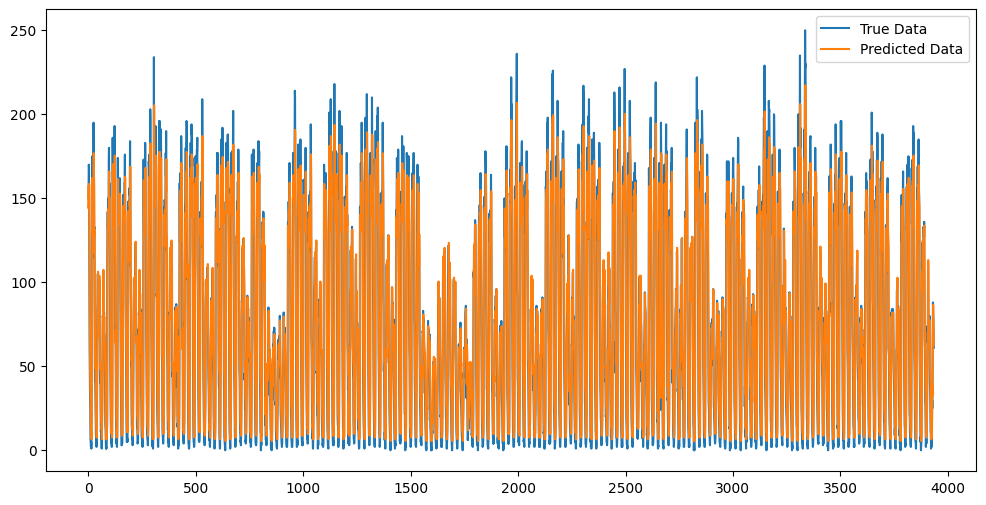

Zone:141, MSE: 642.2020263671875, SMAPE: 0.38127779960632324


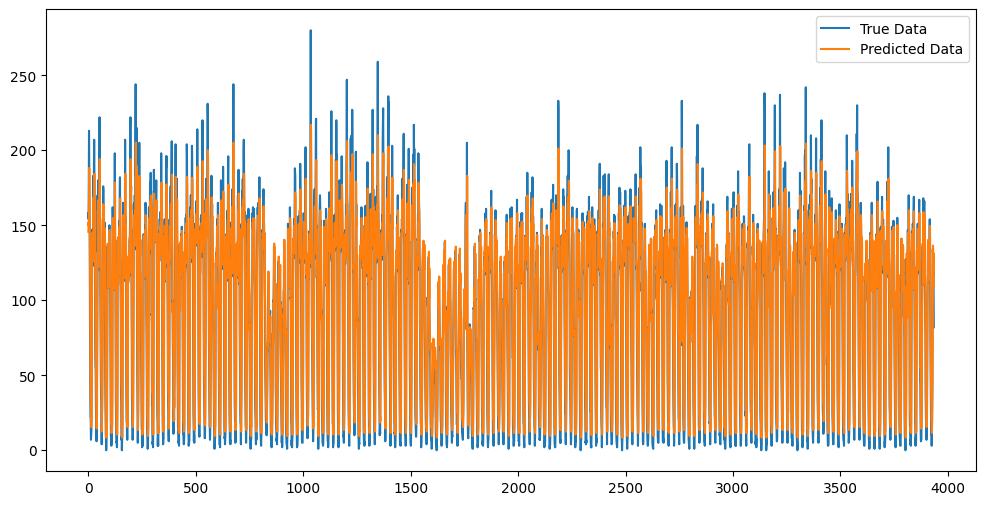

Zone:142, MSE: 2936.18212890625, SMAPE: 0.47741061449050903


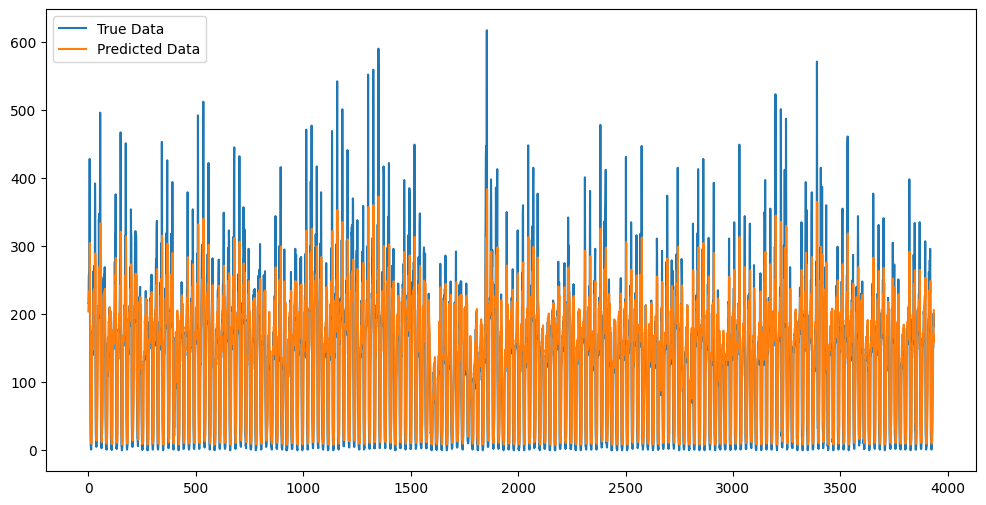

Zone:143, MSE: 228.969482421875, SMAPE: 0.5142191648483276


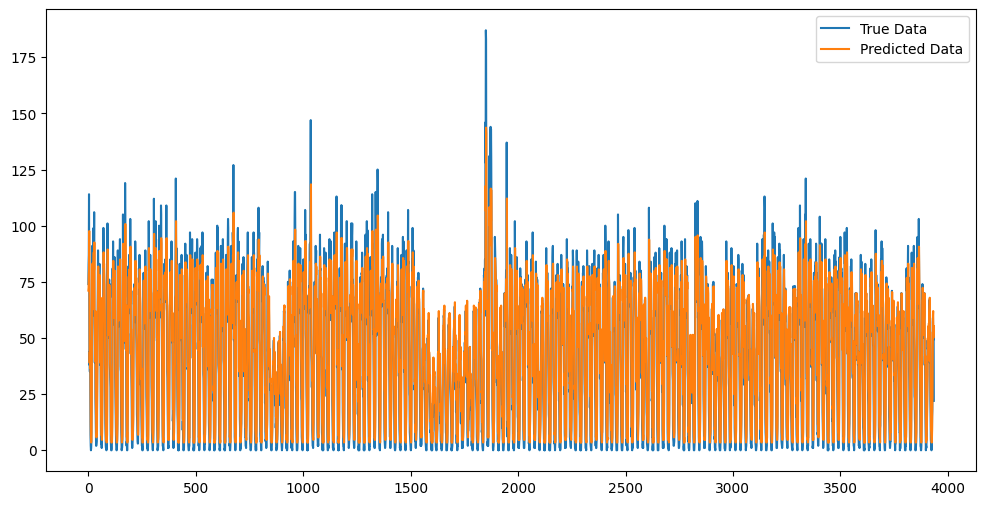

Zone:144, MSE: 192.37109375, SMAPE: 0.4875779151916504


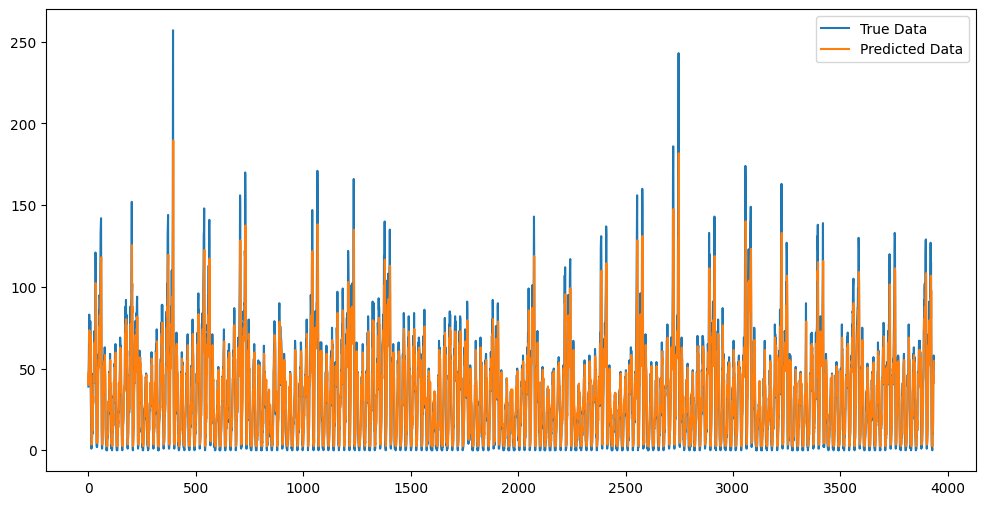

Zone:148, MSE: 574.638671875, SMAPE: 0.4376816749572754


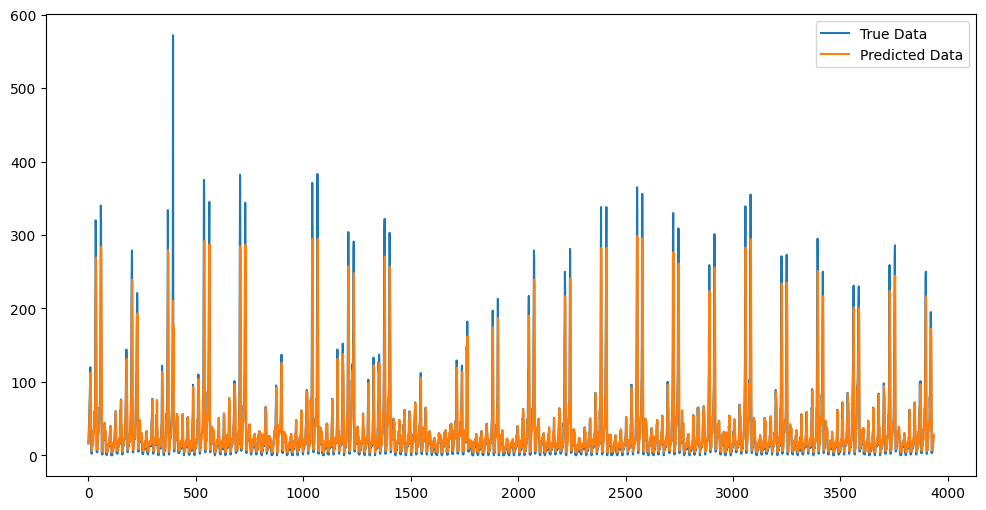

Zone:151, MSE: 127.63379669189453, SMAPE: 0.5283778309822083


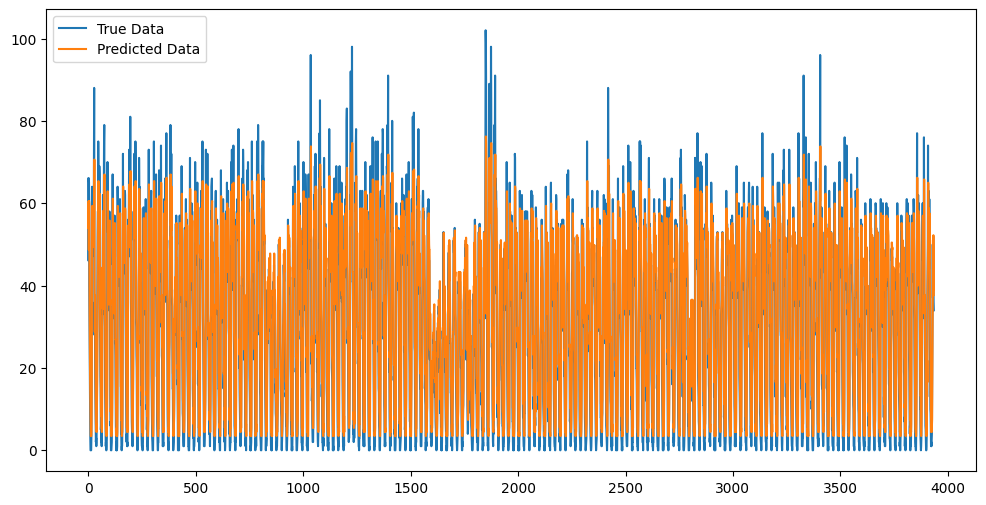

Zone:152, MSE: 3.5806949138641357, SMAPE: 0.9521205425262451


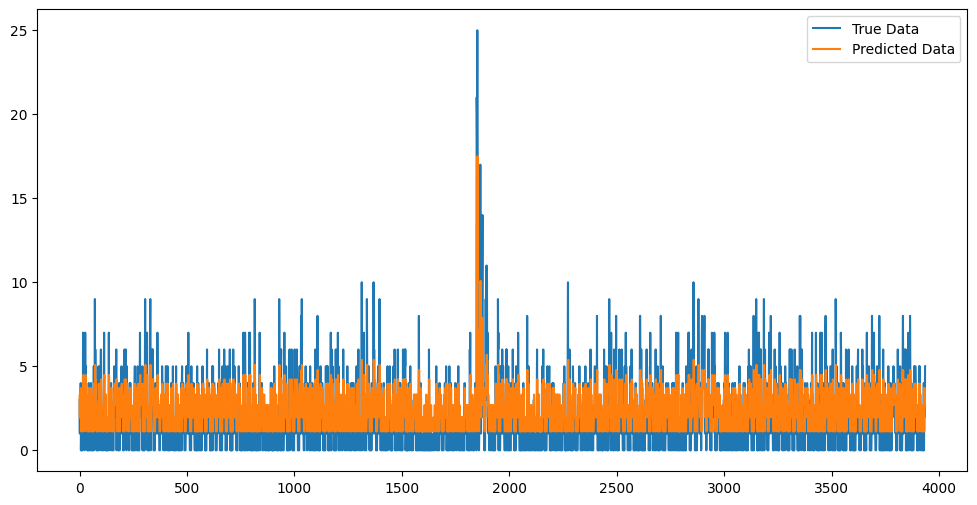

Zone:158, MSE: 178.0098114013672, SMAPE: 0.471925288438797


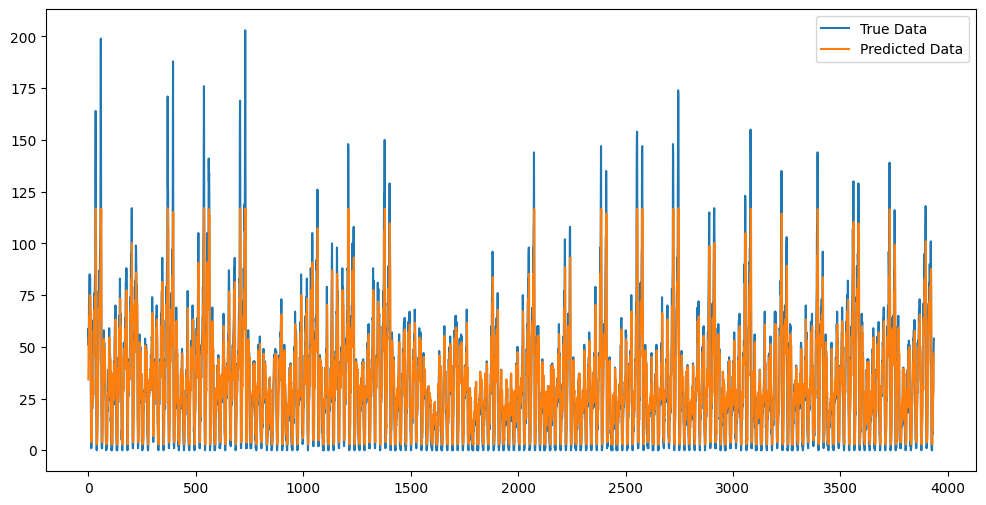

Zone:161, MSE: 2892.38134765625, SMAPE: 0.4554252624511719


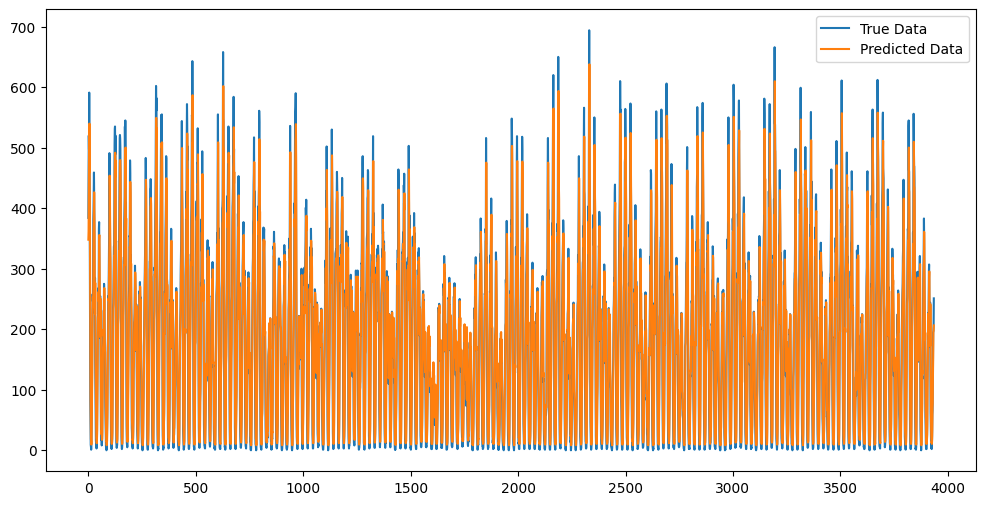

Zone:162, MSE: 1703.397705078125, SMAPE: 0.41620588302612305


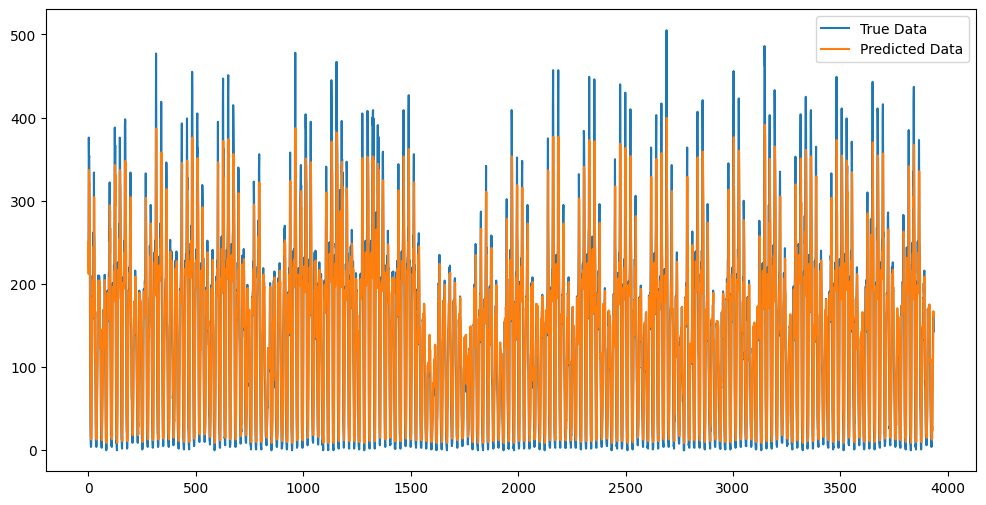

Zone:163, MSE: 1239.00244140625, SMAPE: 0.4109742045402527


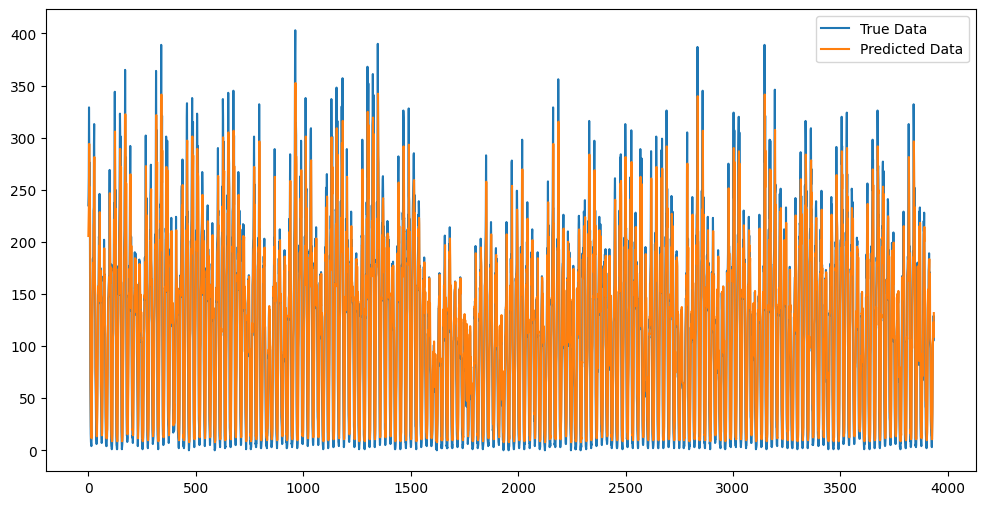

Zone:164, MSE: 619.728515625, SMAPE: 0.35415351390838623


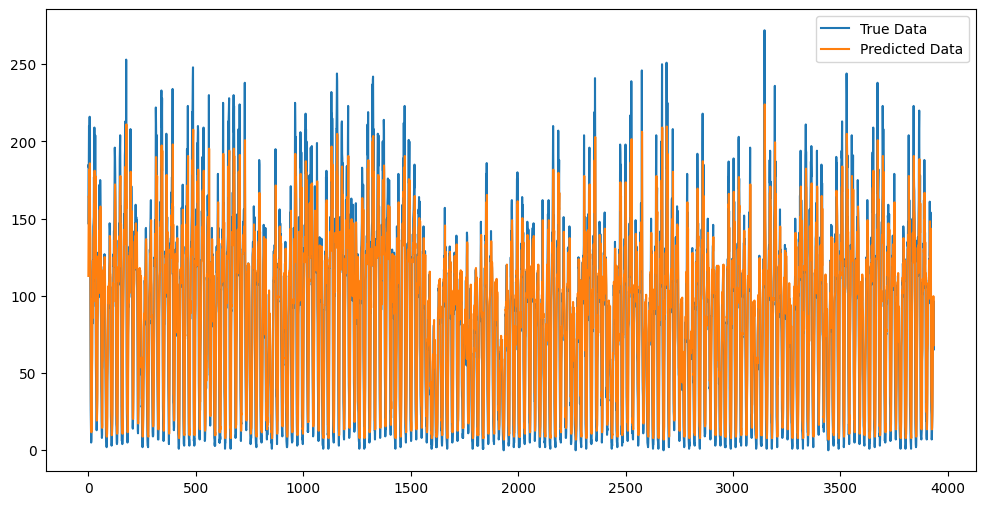

Zone:166, MSE: 53.73420715332031, SMAPE: 0.5401327013969421


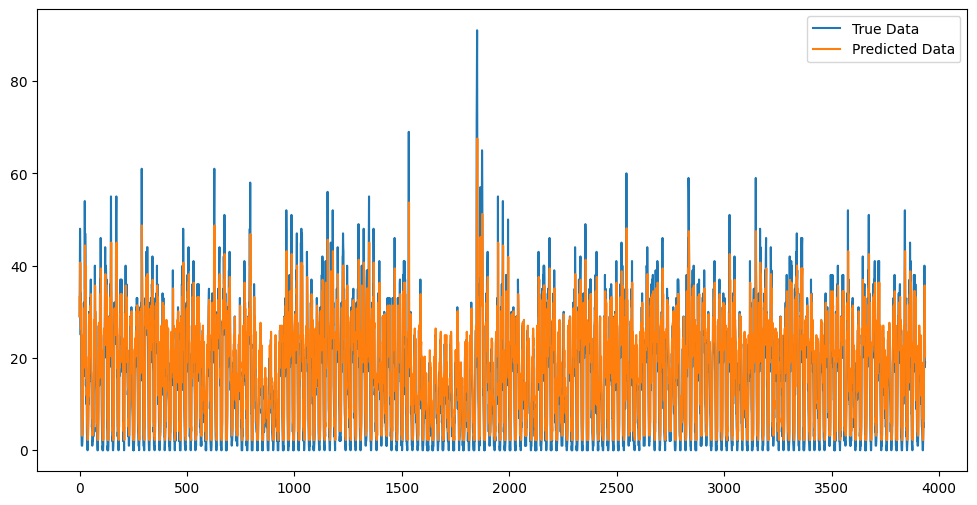

Zone:170, MSE: 868.9579467773438, SMAPE: 0.3943270146846771


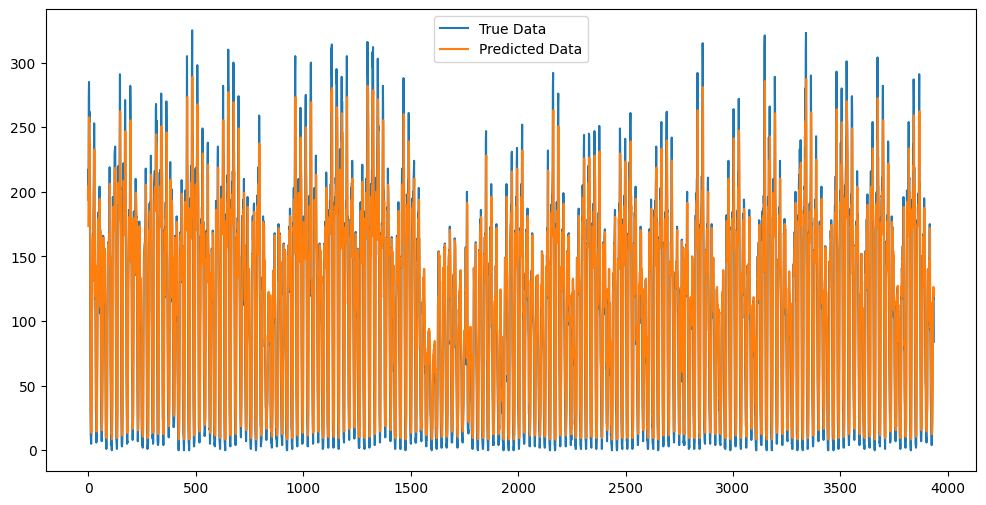

Zone:186, MSE: 1790.4375, SMAPE: 0.37899619340896606


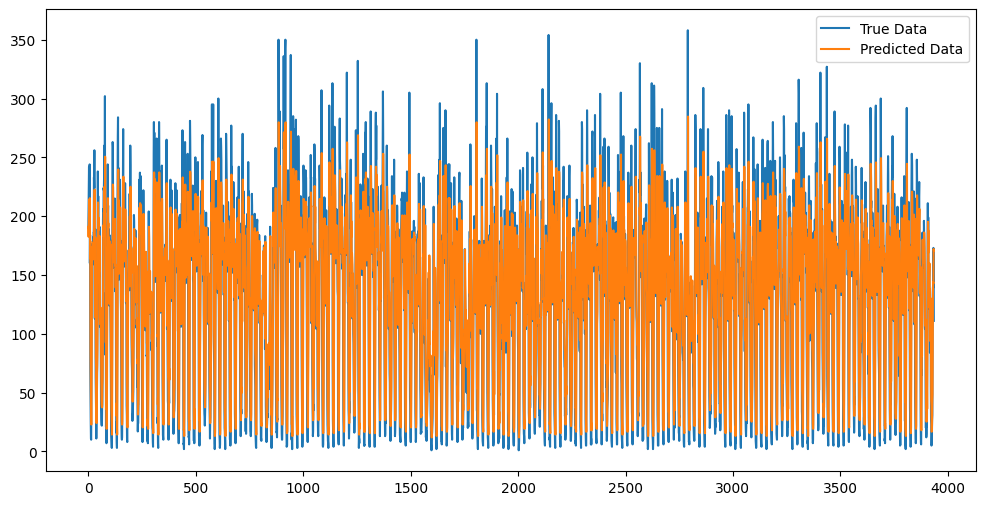

Zone:209, MSE: 12.845756530761719, SMAPE: 0.7348694801330566


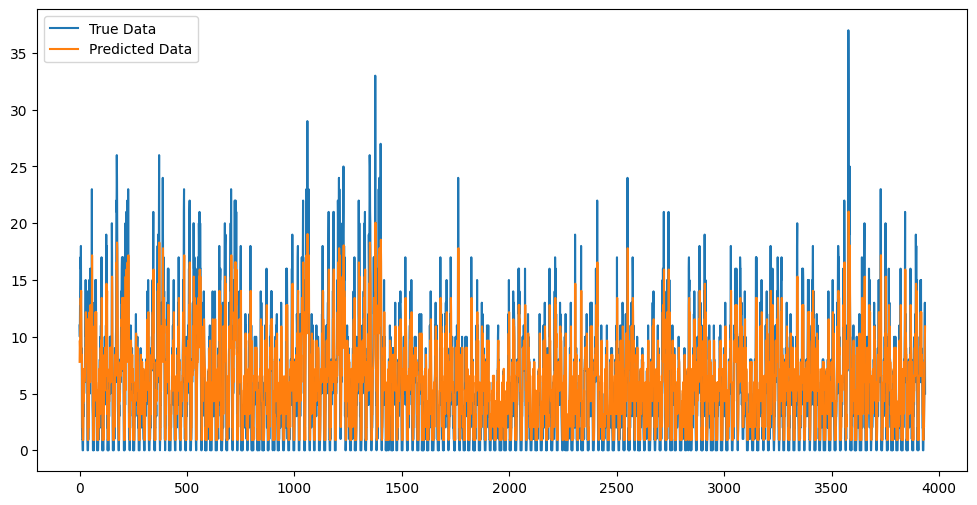

Zone:211, MSE: 116.9620361328125, SMAPE: 0.4776851236820221


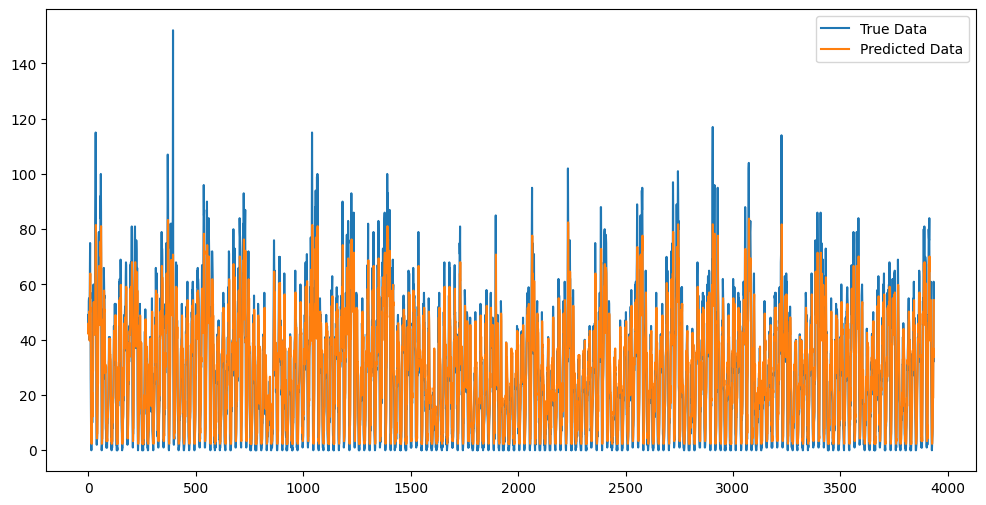

Zone:224, MSE: 7.684460163116455, SMAPE: 0.7276815176010132


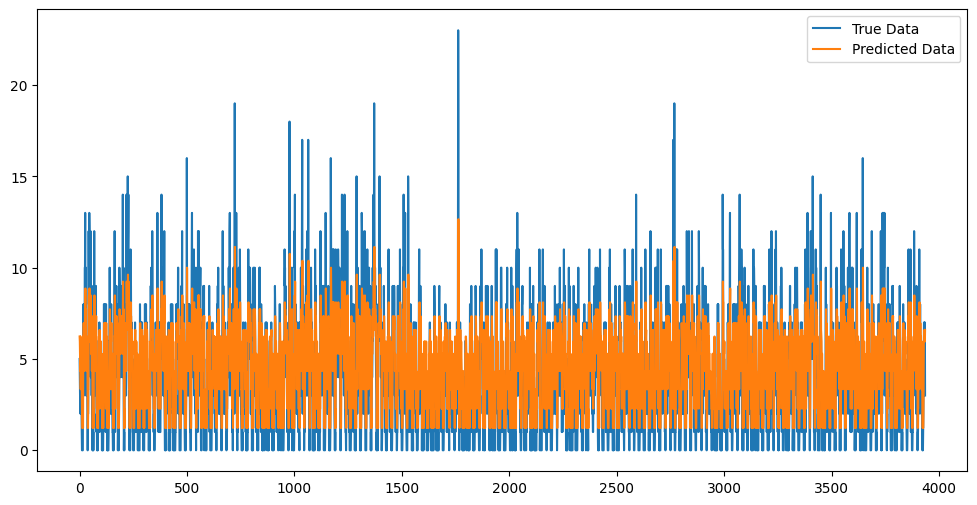

Zone:229, MSE: 471.01715087890625, SMAPE: 0.39316508173942566


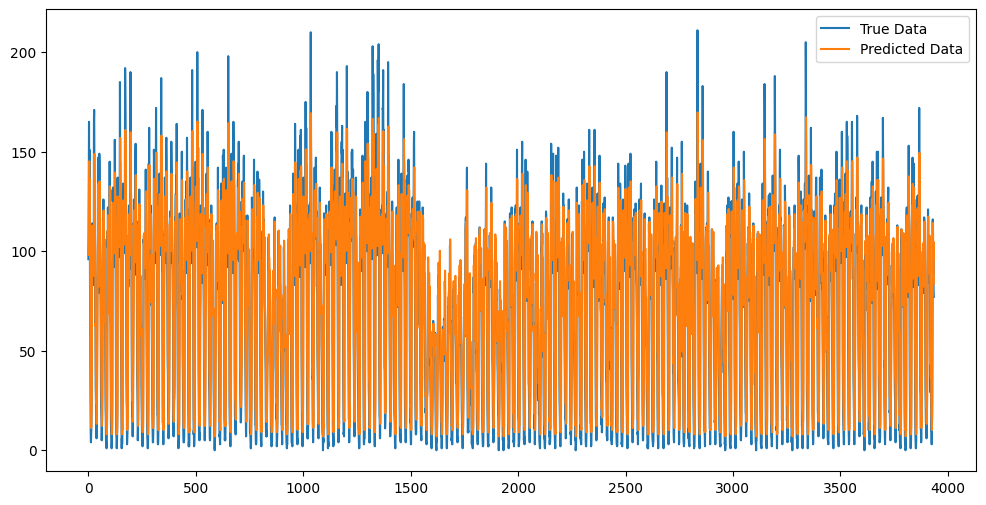

Zone:230, MSE: 1819.4248046875, SMAPE: 0.35705262422561646


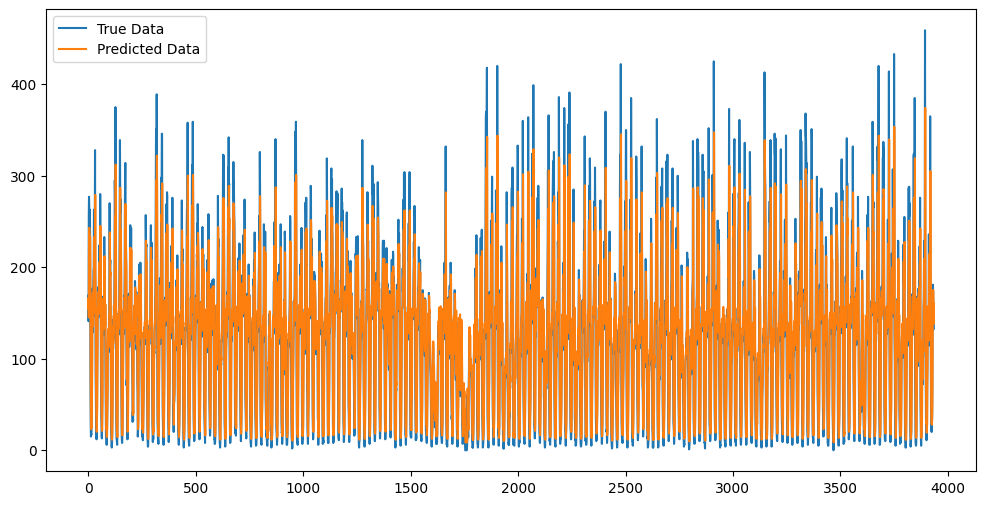

Zone:231, MSE: 230.48269653320312, SMAPE: 0.42968130111694336


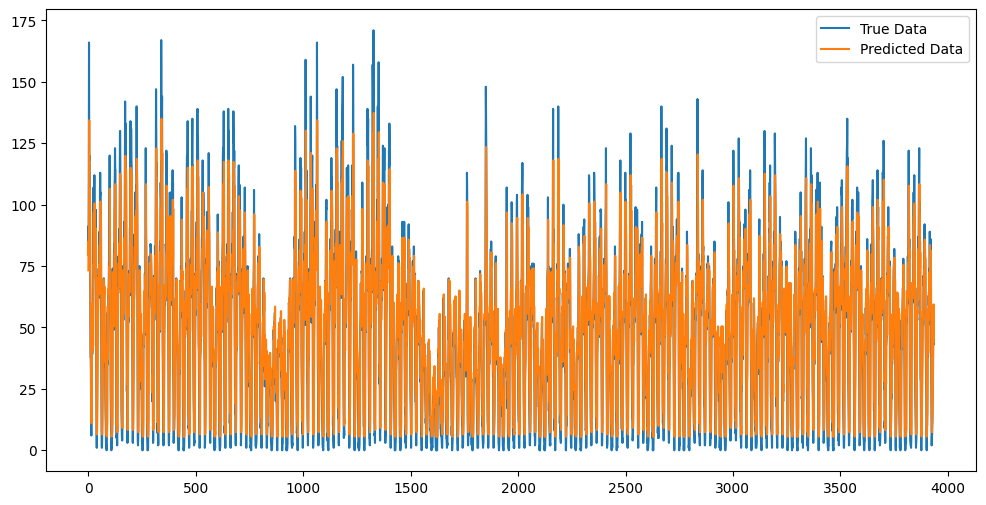

Zone:232, MSE: 8.906925201416016, SMAPE: 0.7926103472709656


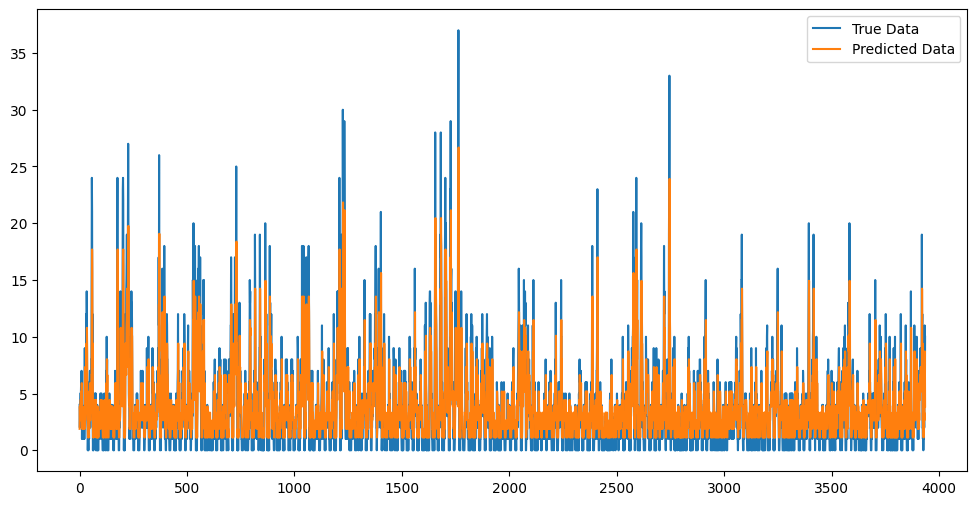

Zone:233, MSE: 235.4949188232422, SMAPE: 0.4508745074272156


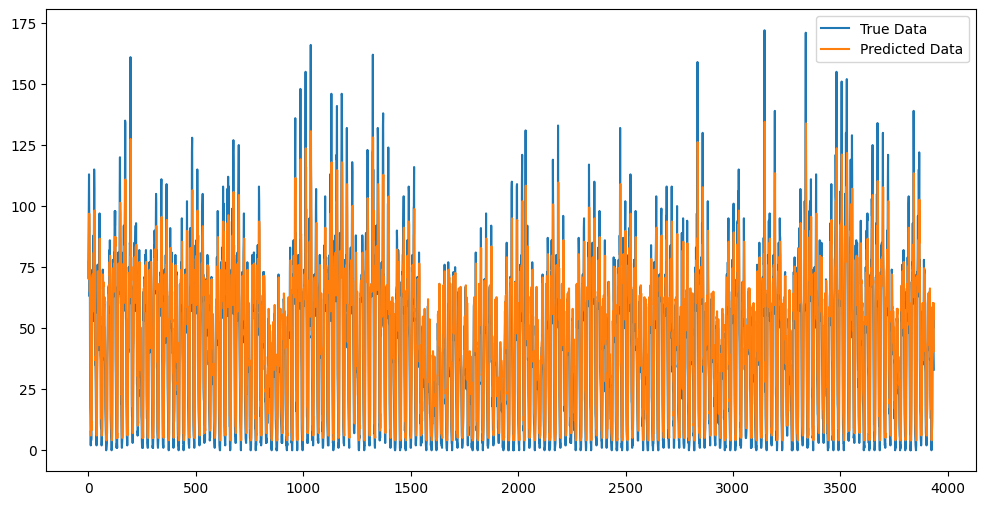

Zone:234, MSE: 796.9415893554688, SMAPE: 0.4221641719341278


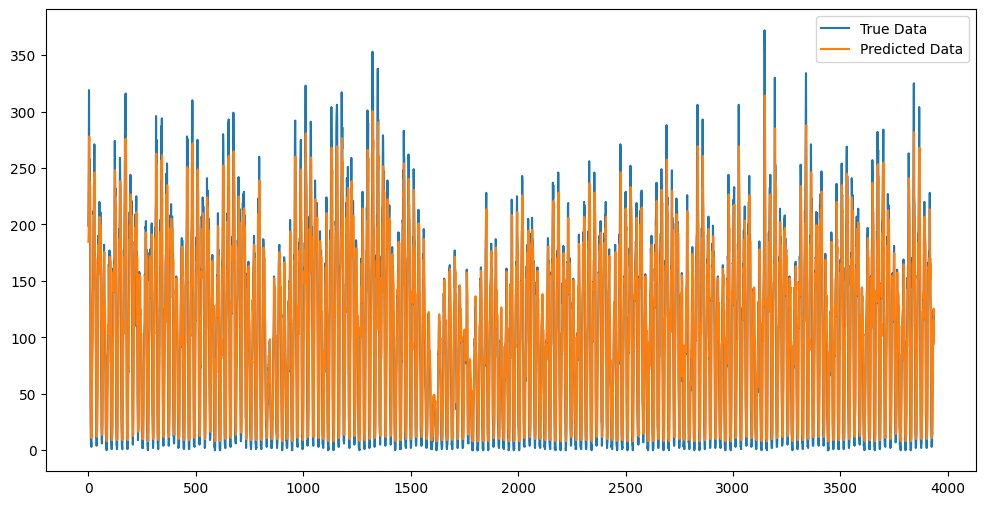

Zone:236, MSE: 2863.786376953125, SMAPE: 0.5494012832641602


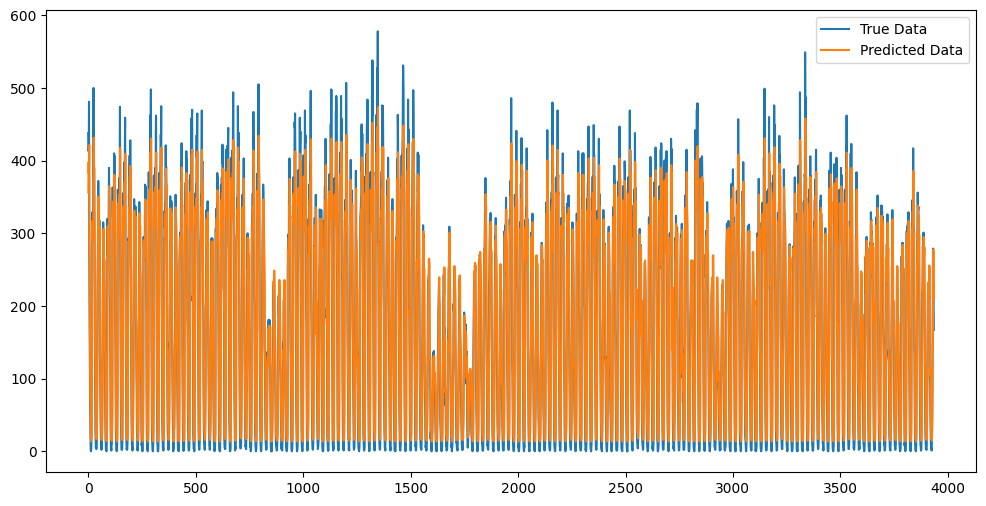

Zone:237, MSE: 2801.344482421875, SMAPE: 0.4898521304130554


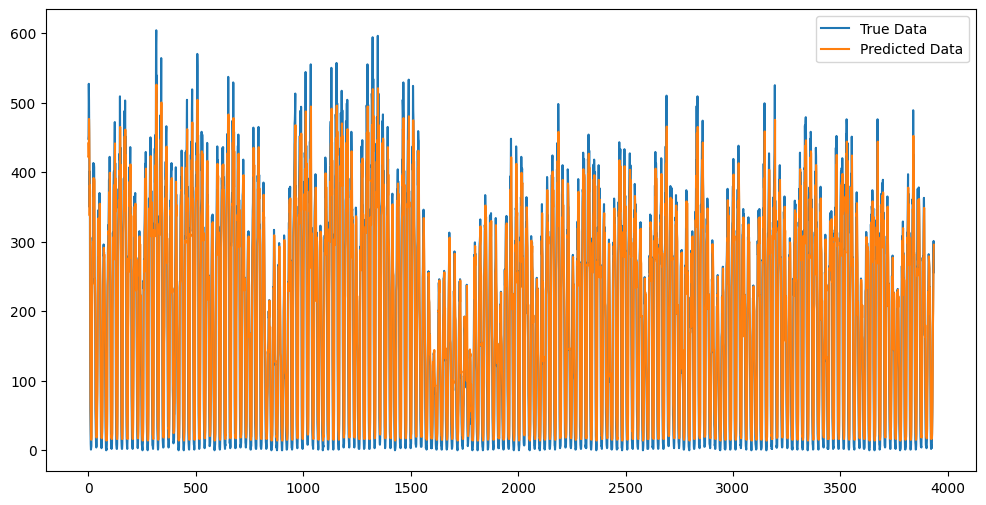

Zone:238, MSE: 615.1679077148438, SMAPE: 0.47503557801246643


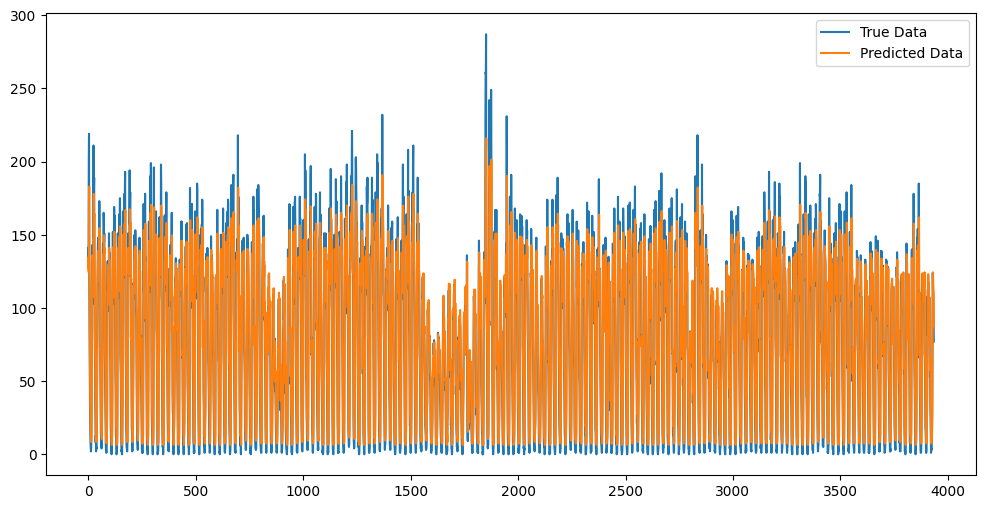

Zone:239, MSE: 1056.140869140625, SMAPE: 0.4430333375930786


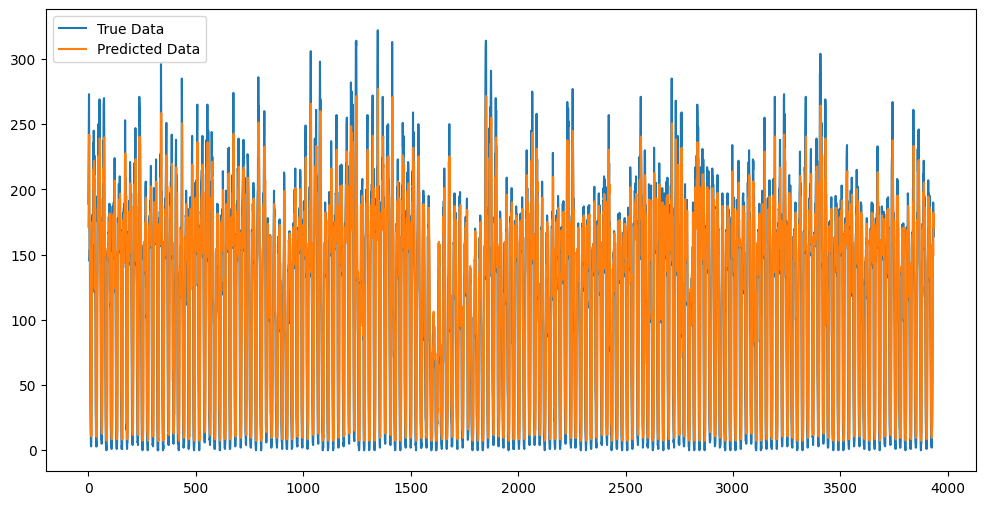

Zone:243, MSE: 0.3789140582084656, SMAPE: 1.7755788564682007


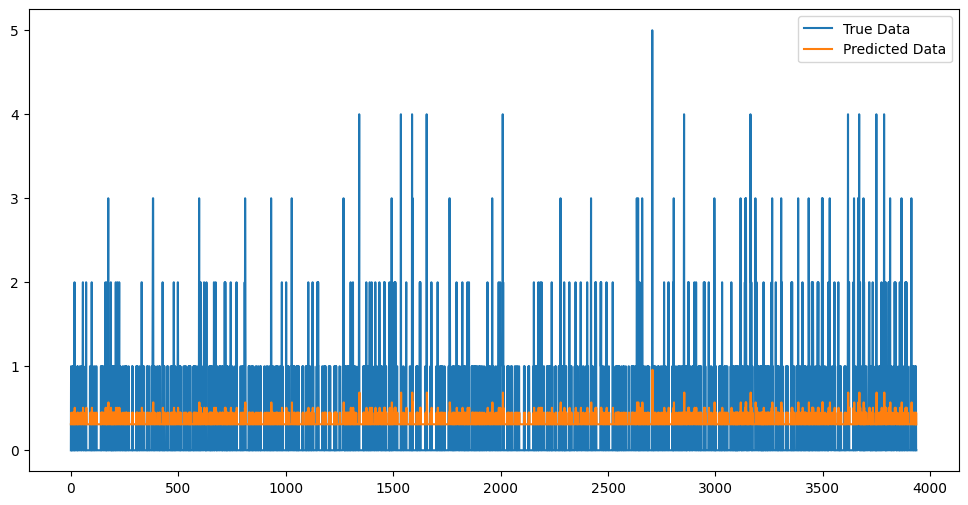

Zone:244, MSE: 2.8035049438476562, SMAPE: 1.015648603439331


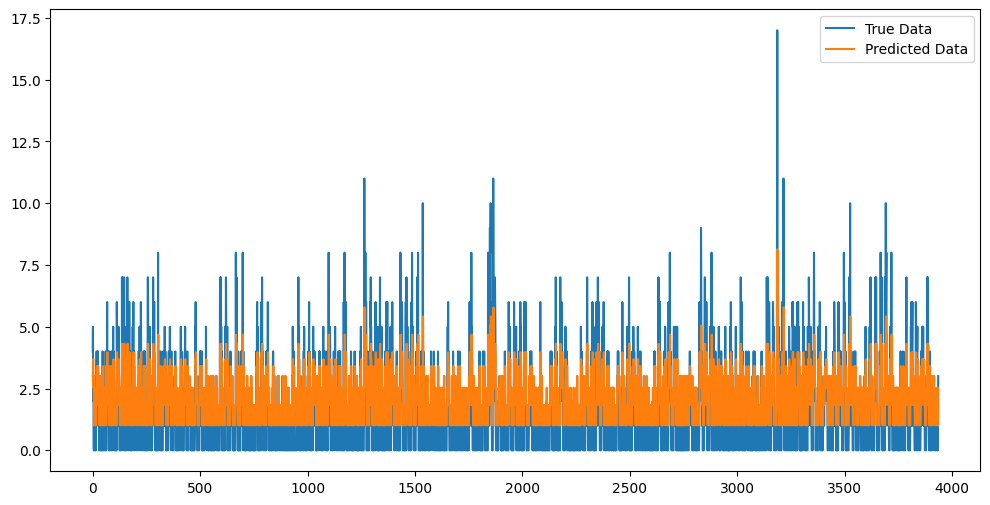

Zone:246, MSE: 516.7549438476562, SMAPE: 0.4279244840145111


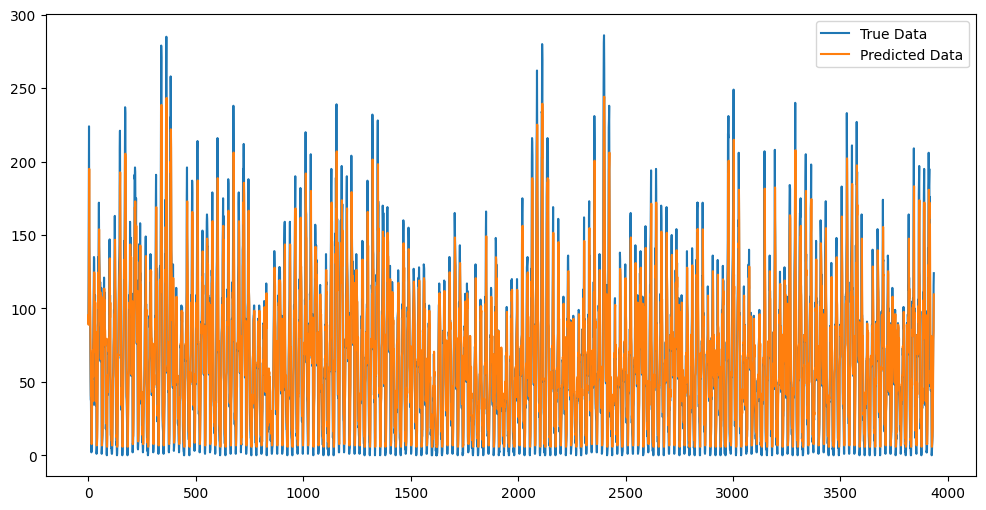

Zone:249, MSE: 1082.3800048828125, SMAPE: 0.3618985116481781


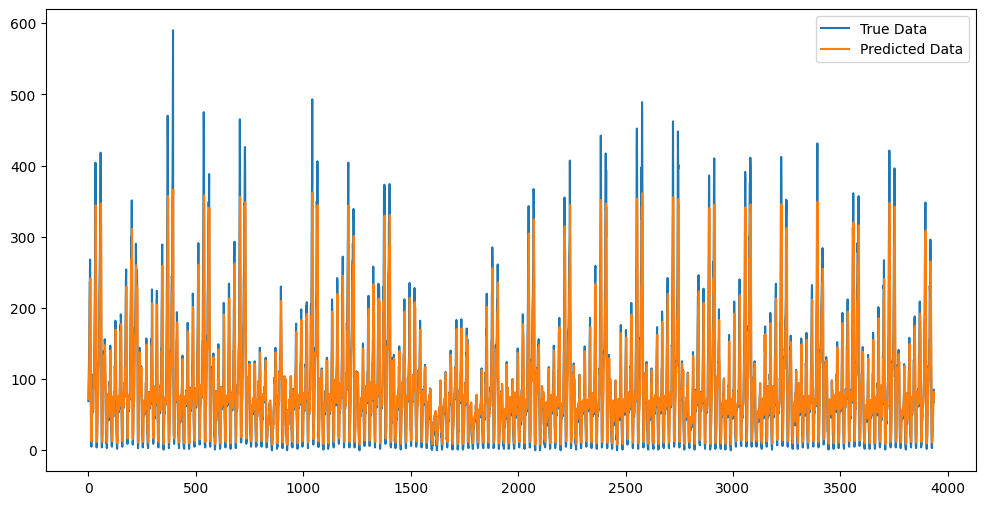

Zone:261, MSE: 53.842857360839844, SMAPE: 0.597564697265625


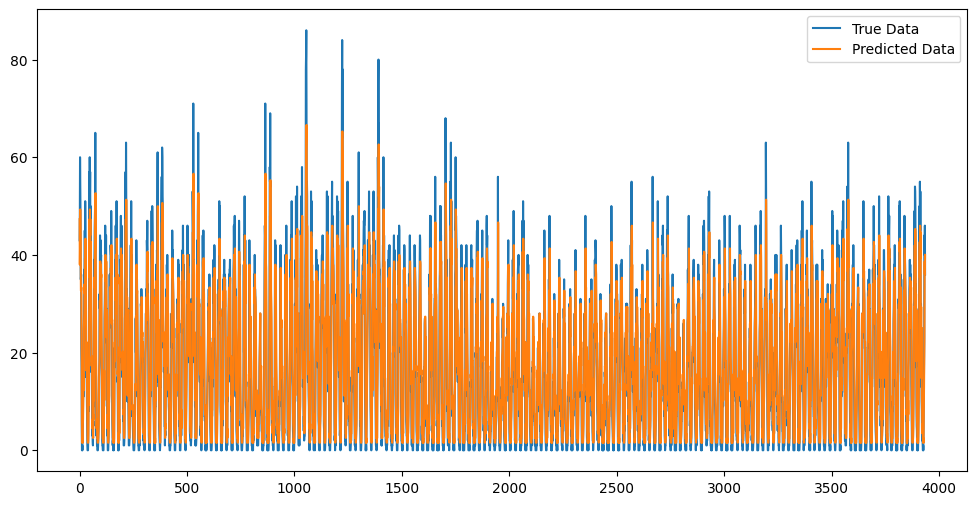

Zone:262, MSE: 367.582763671875, SMAPE: 0.5289503931999207


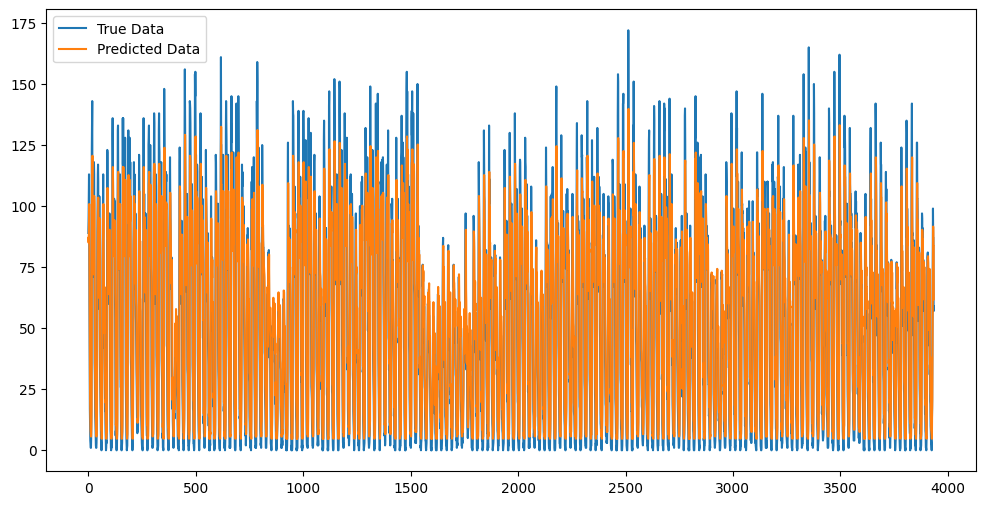

Zone:263, MSE: 428.6222839355469, SMAPE: 0.3626357614994049


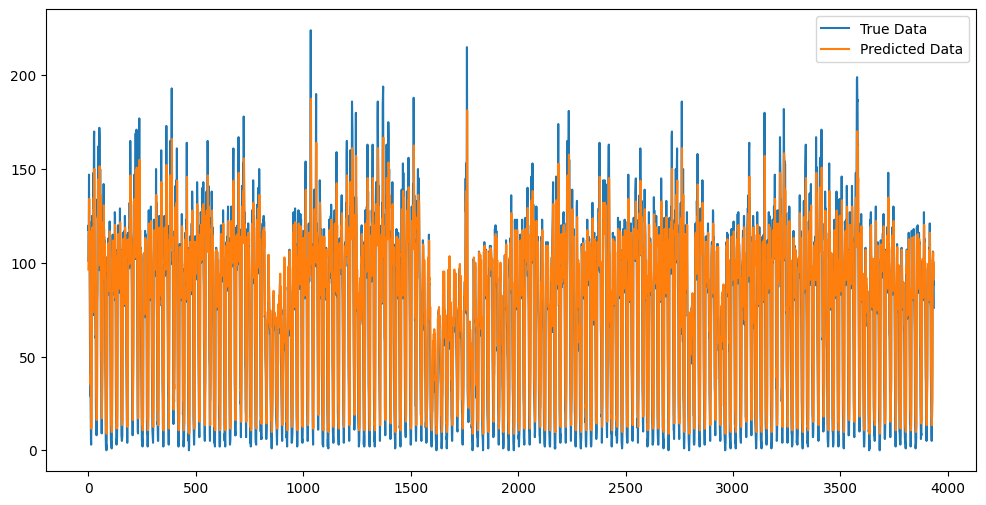

In [48]:
# Model evaluation on test data for each zone

mse_total=0
smape_total=0

for zone in zones:
    model = models[zone]
    test_loader = test_loaders[zone]
    scaler = scalers[zone]
    model.eval()
    with torch.no_grad():
        test_preds = []
        test_labels = []

        for batch_X, batch_y in test_loader:
            preds = model(batch_X)
            test_preds.append(preds)
            test_labels.append(batch_y)

        test_preds = torch.cat(test_preds, dim=0)
        test_labels = torch.cat(test_labels, dim=0)


        # Inverse transform to get the original scale
        test_preds = scaler.inverse_transform(test_preds.numpy().reshape(-1, 1))
        test_labels = scaler.inverse_transform(test_labels.numpy().reshape(-1, 1))
        mse_zone = mean_squared_error(test_preds, test_labels)
        smape_zone = smape(test_preds, test_labels)
        print(f'Zone:{zone}, MSE: {mse_zone}, SMAPE: {smape_zone}')
        mse_total+=mse_zone
        smape_total+=smape_zone

        plt.figure(figsize=(12, 6))
        plt.plot(range(len(test_labels)), test_labels, label='True Data')
        plt.plot(range(len(test_preds)), test_preds, label='Predicted Data')
        plt.legend()
        plt.show()

**Overall model performance on all test zone data across all zones**

In [49]:
mse_overall=mse_total/len(zones)
smape_overall=smape_total/len(zones)
print(f'MSE over all zones: {mse_overall}, SMAPE over all zones: {smape_overall}')
#makes sense as each zone has the same number of test data points

MSE over all zones: 547.519071621643, SMAPE over all zones: 0.6257669835809677
